In [1]:
import xarray as xr
import fsspec
import fv3fit
import os
import matplotlib.pyplot as plt
import numpy as np
import vcm
from vcm.catalog import catalog 
from vcm import DerivedMapping
import dask.diagnostics
import math
import cftime
import time
import fv3viz
import joblib
import intake
import pandas as pd
import json
import cartopy.crs as ccrs
from math import isclose
from fv3fit.sklearn._ocsvm_novelty_detector import OCSVMNoveltyDetector
from fv3fit.sklearn._min_max_novelty_detector import MinMaxNoveltyDetector




In [2]:
BASELINE_ALG = "baseline"
ML_ONLY_ALG = "ml-only"
ML_ONLY_TQ_ALG = "ml-only-tq"
OCSVM_ALG = "ocsvm"
MINMAX_ALG = "minmax"

In [36]:
runs = {
    BASELINE_ALG: {
        "url": "gs://vcm-ml-experiments/claytons/2022-08-10/baseline-trial2/",
        "alg": BASELINE_ALG
    },
    ML_ONLY_ALG: {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-01-25/ml-tapered-all-tquv-seed-0/",
        "alg": ML_ONLY_ALG
    },
    "minmax_T": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-01-24/oos-tapered-tquv-nd-minmax-0-default-0-trial0/",
        "alg": MINMAX_ALG,
        "cutoff": 0,
        "cutoff_true": 0
    },
    "ocsvm_T": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-01-24/oos-tapered-tquv-nd-ocsvm-t-0-default-0-trial0/",
        "alg": OCSVM_ALG,
        "cutoff": 0,
        "gamma": 4/79,
        "cutoff_true": 0
    },
    # gamma = 1/79
    "ocsvm-gamma-1_79-95pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-1_79-nu-5e-3--221.6/",
        "alg": OCSVM_ALG,
        "gamma": 1/79,
        "cutoff": -221.6,
        "cutoff_true": 226.8
    },
    "ocsvm-gamma-1_79-75pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-1_79-nu-5e-3--283.5/",
        "alg": OCSVM_ALG,
        "gamma": 1/79,
        "cutoff": -283.5,
        "cutoff_true": 288.7
    },
    "ocsvm-gamma-1_79-50pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-1_79-nu-5e-3--315/",
        "alg": OCSVM_ALG,
        "gamma": 1/79,
        "cutoff": -315,
        "cutoff_true": 321
    },
    "ocsvm-gamma-1_79-25pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-1_79-nu-5e-3--346/",
        "alg": OCSVM_ALG,
        "gamma": 1/79,
        "cutoff": -346,
        "cutoff_true": 351.5
    },
    # gamma = 2/79
    "ocsvm-gamma-2_79-99pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-2_79-nu-5e-3--20.7/",
        "alg": OCSVM_ALG,
        "gamma": 2/79,
        "cutoff": -20.7,
        "cutoff_true": 22.3
    },
    "ocsvm-gamma-2_79-95pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-2_79-nu-5e-3--40.0/",
        "alg": OCSVM_ALG,
        "gamma": 2/79,
        "cutoff": -40.0,
        "cutoff_true": 41.7
    },
    "ocsvm-gamma-2_79-75pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-2_79-nu-5e-3--58.7/",
        "alg": OCSVM_ALG,
        "gamma": 2/79,
        "cutoff": -58.7,
        "cutoff_true": 60.3
    },
    "ocsvm-gamma-2_79-50pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-2_79-nu-5e-3--68.6/",
        "alg": OCSVM_ALG,
        "gamma": 2/79,
        "cutoff": -68.6,
        "cutoff_true": 70.3
    },
    "ocsvm-gamma-2_79-25pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-2_79-nu-5e-3--78.0/",
        "alg": OCSVM_ALG,
        "gamma": 2/79,
        "cutoff": -78.0,
        "cutoff_true": 79.7
    },
    # gamma = 4/79
    "ocsvm-gamma-4_79-99pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-21/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-4_79-nu-1e-4-0.095/",
        "alg": OCSVM_ALG,
        "gamma": 4/79,
        "cutoff": 0.095,
        "cutoff_true": 0.025
    },
    "ocsvm-gamma-4_79-95pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-21/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-4_79-nu-1e-4-0.055/",
        "alg": OCSVM_ALG,
        "gamma": 4/79,
        "cutoff": 0.055,
        "cutoff_true": 0.065
    },
    "ocsvm-gamma-4_79-75pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-01-24/oos-tapered-tquv-nd-ocsvm-tq-0-default-0-trial0/",
        "alg": OCSVM_ALG,
        "gamma": 4/79,
        "cutoff": 0,
        "cutoff_true": 0.12
    },
    "ocsvm-gamma-4_79-50pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-21/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-4_79-nu-1e-4--0.03/",
        "alg": OCSVM_ALG,
        "gamma": 4/79,
        "cutoff": -0.03,
        "cutoff_true": 0.15
    },
    "ocsvm-gamma-4_79-25pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-21/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-4_79-nu-1e-4--0.05/",
        "alg": OCSVM_ALG,
        "gamma": 4/79,
        "cutoff": -0.05,
        "cutoff_true": 0.17
    },
    # gamma = 8/79
    "ocsvm-gamma-8_79-99pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-21/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-8_79-nu-4e-6-0.00032/",
        "alg": OCSVM_ALG,
        "gamma": 8/79,
        "cutoff": 0.00032,
        "cutoff_true": 1.7e-5
    },
    "ocsvm-gamma-8_79-95pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-21/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-8_79-nu-4e-6-0.00024/",
        "alg": OCSVM_ALG,
        "gamma": 8/79,
        "cutoff": 0.00024,
        "cutoff_true": 9.3e-5
    },
    "ocsvm-gamma-8_79-75pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-21/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-8_79-nu-4e-6-5.3e-05/",
        "alg": OCSVM_ALG,
        "gamma": 8/79,
        "cutoff": 5.3e-05,
        "cutoff_true": 2.8e-4
    },
    "ocsvm-gamma-8_79-50pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-21/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-8_79-nu-4e-6--0.00011/",
        "alg": OCSVM_ALG,
        "gamma": 8/79,
        "cutoff": -0.00011,
        "cutoff_true": 4.4e-4
    },
    "ocsvm-gamma-8_79-25pct": {
        "url": "gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-21/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-8_79-nu-4e-6--0.00026/",
        "alg": OCSVM_ALG,
        "gamma": 8/79,
        "cutoff": -0.00026,
        "cutoff_true": 5.9e-4
    },
}

In [4]:
fv3viz.use_colorblind_friendly_style()

In [5]:
run_dir = 'fv3gfs_run'
diags = {
    name: xr.open_zarr(fsspec.get_mapper(os.path.join(run["url"], run_dir, 'diags.zarr')))
    for name, run in runs.items()
}

/home/claytons/miniconda3/envs/fv3net/lib/python3.8/site-packages/google/auth/_default.py:70: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. We recommend you rerun `gcloud auth application-default login` and make sure a quota project is added. Or you can use service accounts instead. For more information about service accounts, see https://cloud.google.com/docs/authentication/
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)


In [6]:
diags_3d = {
    name: xr.open_zarr(fsspec.get_mapper(os.path.join(run["url"], run_dir, 'diags_3d.zarr')))
    for name, run in runs.items()
    if name not in ["baseline"]
}

In [7]:
states = {
    name: xr.open_zarr(fsspec.get_mapper(os.path.join(run["url"], run_dir, 'state_after_timestep.zarr')))
    for name, run in runs.items()
}

In [8]:
atmos = {
    name: xr.open_zarr(fsspec.get_mapper(os.path.join(run["url"], run_dir, 'atmos_dt_atmos.zarr')))
    for name, run in runs.items()
}

In [9]:
validation = xr.open_zarr(fsspec.get_mapper(
    "gs://vcm-ml-intermediate/2021-10-12-PIRE-c48-post-spinup-verification/pire_atmos_dyn_plev_coarse_3h.zarr"
))

In [10]:
def diagnostics_path(name):
    return os.path.join(runs[name]['url'], f"{run_dir}_diagnostics")

In [11]:
# command to run to save all diagnostic files locally
for name in runs:
    print(f"mkdir {name}\ngsutil cp {os.path.join(diagnostics_path(name), 'diags.nc')} {name}")

mkdir baseline
gsutil cp gs://vcm-ml-experiments/claytons/2022-08-10/baseline-trial2/fv3gfs_run_diagnostics/diags.nc baseline
mkdir ml-only
gsutil cp gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-01-25/ml-tapered-all-tquv-seed-0/fv3gfs_run_diagnostics/diags.nc ml-only
mkdir minmax_T
gsutil cp gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-01-24/oos-tapered-tquv-nd-minmax-0-default-0-trial0/fv3gfs_run_diagnostics/diags.nc minmax_T
mkdir ocsvm_T
gsutil cp gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-01-24/oos-tapered-tquv-nd-ocsvm-t-0-default-0-trial0/fv3gfs_run_diagnostics/diags.nc ocsvm_T
mkdir ocsvm-gamma-1_79-95pct
gsutil cp gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity_final-ocsvm-tq-gamma-1_79-nu-5e-3--221.6/fv3gfs_run_diagnostics/diags.nc ocsvm-gamma-1_79-95pct
mkdir ocsvm-gamma-1_79-75pct
gsutil cp gs://vcm-ml-experiments/out-of-sample-right-side-up-winds/2023-02-18/ocsvm_tq_sensitivity

In [12]:
diags_complete = {}
for name in runs:
    print(f"Reading diags with name {name}")
    with open(f"../datasets_corrected/{name}/diags.nc", 'rb') as f:
        diags_complete[name] = xr.open_dataset(f).load()


Reading diags with name baseline
Reading diags with name ml-only
Reading diags with name minmax_T
Reading diags with name ocsvm_T
Reading diags with name ocsvm-gamma-1_79-95pct
Reading diags with name ocsvm-gamma-1_79-75pct
Reading diags with name ocsvm-gamma-1_79-50pct
Reading diags with name ocsvm-gamma-1_79-25pct
Reading diags with name ocsvm-gamma-2_79-99pct
Reading diags with name ocsvm-gamma-2_79-95pct
Reading diags with name ocsvm-gamma-2_79-75pct
Reading diags with name ocsvm-gamma-2_79-50pct
Reading diags with name ocsvm-gamma-2_79-25pct
Reading diags with name ocsvm-gamma-4_79-99pct
Reading diags with name ocsvm-gamma-4_79-95pct
Reading diags with name ocsvm-gamma-4_79-75pct
Reading diags with name ocsvm-gamma-4_79-50pct
Reading diags with name ocsvm-gamma-4_79-25pct
Reading diags with name ocsvm-gamma-8_79-99pct
Reading diags with name ocsvm-gamma-8_79-95pct
Reading diags with name ocsvm-gamma-8_79-75pct
Reading diags with name ocsvm-gamma-8_79-50pct
Reading diags with name 

In [13]:
metrics = {}
for name, run in runs.items():
    path = os.path.join(diagnostics_path(name), 'metrics.json')
    with fsspec.open(path, 'rb') as f:
        metrics[name] = json.load(f)

In [41]:
novelty_fractions = {name:
    1 if name == BASELINE_ALG
    else 0 if name in [ML_ONLY_ALG, ML_ONLY_TQ_ALG]
    else diags[name].is_novelty.mean().values.item()
    for name, run in runs.items()
}

In [30]:
def get_names_alg(alg, gamma=None, include_bp=False):
    if gamma is None:
        if include_bp:
            return [name for name, run in runs.items() if run["alg"] in [alg, BASELINE_ALG, ML_ONLY_ALG, ML_ONLY_TQ_ALG]]
        else:
            return [name for name, run in runs.items() if run["alg"] == alg]
    else:
        assert alg == OCSVM_ALG
        if include_bp:
            return [
                name for name, run in runs.items()
                    if run["alg"] in [BASELINE_ALG, ML_ONLY_ALG]
                        or (run["alg"] == alg and isclose(run["gamma"], gamma, abs_tol=110**-10))
            ] 
        else:
            return [name for name, run in runs.items() if run["alg"] == alg and isclose(run["gamma"], gamma, abs_tol=10**-10)]

In [14]:
OCSVM_LARGE_GAMMA = "ocsvm-gamma-8_79-75pct"
OCSVM_DEFAULT = "ocsvm-gamma-4_79-75pct"
OCSVM_SMALL_GAMMA = "ocsvm-gamma-2_79-75pct"
OCSVM_SMALLEST_GAMMA = "ocsvm-gamma-1_79-75pct"
MINMAX_T = "minmax_T"
OCSVM_T = "ocsvm_T"

## Table {tab:metrics}

In [22]:
table_run_names = {
    BASELINE_ALG: r"Baseline",
    # "prognostic-tq": r"ML-corrected $g_{\mathrm{Tq}}$",
    ML_ONLY_ALG: r"ML-corrected $g_{\mathrm{Tquv}}$",
    MINMAX_T: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{T, minmax}}$",
    OCSVM_T: r"ND ML $g_{\mathrm{Tq}}, \eta_{\mathrm{T, OCSVM}}, \gamma=\frac{4}{79}$",
    # OCSVM_SMALLEST_GAMMA: r"ND ML $g_{\mathrm{Tq}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{1}{79}$",
    # OCSVM_SMALL_GAMMA: r"ND ML $g_{\mathrm{Tq}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{2}{79}$",
    OCSVM_DEFAULT: r"ND ML $g_{\mathrm{Tq}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{4}{79}$",
    # OCSVM_LARGE_GAMMA: r"ND ML $g_{\mathrm{Tq}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{8}{79}$",
    # "ocsvm-gamma-4_79-0": r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{T, OCSVM}}$",
    # "ocsvm-humidity-gamma-4_79-0":  r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}$"
}

In [23]:
table_metrics = [
    "rmse_of_time_mean/tmp200",
    "rmse_of_time_mean/tmp850",
    "rmse_of_time_mean/total_precip_to_surface",
    "rmse_of_time_mean/pwat"
]

In [24]:
diags_complete[OCSVM_DEFAULT].is_novelty_spatial_mean_global.mean()

<xarray.DataArray 'is_novelty_spatial_mean_global' ()>
array(0.18738389)

In [25]:
for name in table_run_names:
    if name not in [BASELINE_ALG, ML_ONLY_ALG, ML_ONLY_TQ_ALG]:
        print(f"{name} novelty_rate: {diags_complete[name].is_novelty_spatial_mean_global.mean().item()}")
    for metric in table_metrics:
        print(f"{name} {metric}: {metrics[name][metric]['value']}")

baseline rmse_of_time_mean/tmp200: 2.4777960777282715
baseline rmse_of_time_mean/tmp850: 2.0860824584960938
baseline rmse_of_time_mean/total_precip_to_surface: 1.7809481457785814
baseline rmse_of_time_mean/pwat: 2.794926881790161
ml-only rmse_of_time_mean/tmp200: 3.845698118209839
ml-only rmse_of_time_mean/tmp850: 1.2622606754302979
ml-only rmse_of_time_mean/total_precip_to_surface: 1.3271982663834156
ml-only rmse_of_time_mean/pwat: 4.425719261169434
minmax_T novelty_rate: 0.00822972461575585
minmax_T rmse_of_time_mean/tmp200: 3.9438884258270264
minmax_T rmse_of_time_mean/tmp850: 1.3054041862487793
minmax_T rmse_of_time_mean/total_precip_to_surface: 1.3354866639953367
minmax_T rmse_of_time_mean/pwat: 4.429327964782715
ocsvm_T novelty_rate: 0.045816877581451844
ocsvm_T rmse_of_time_mean/tmp200: 3.3786559104919434
ocsvm_T rmse_of_time_mean/tmp850: 1.3291258811950684
ocsvm_T rmse_of_time_mean/total_precip_to_surface: 1.3504983560841757
ocsvm_T rmse_of_time_mean/pwat: 4.553725719451904
ocs

## Figure {fig:prevent-explosion}

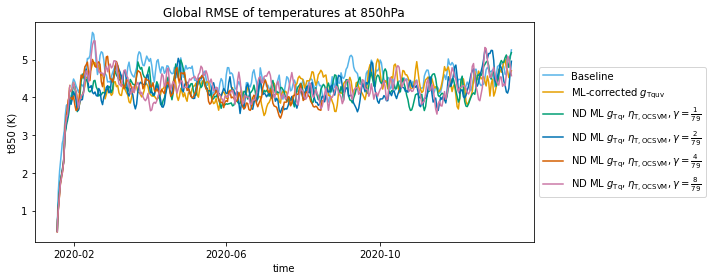

In [21]:
# use xr plots to visualize time vs rmse temp850 
# plt.rcParams['text.usetex'] = True
plt.figure(figsize=(10, 4), tight_layout=True)
for name, label in table_run_names.items():
    diags_complete[name].tmp850_rms_global.plot(label=label)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel(r"t850 (K)")
plt.title(r"Global RMSE of temperatures at 850hPa")
plt.show()

## Figure {fig: temp-map-plots}

In [22]:
map_plot_names = {
    BASELINE_ALG: r"Baseline",
    ML_ONLY_ALG: r"ML-corrected $g_{\mathrm{Tq}}$",
    OCSVM_DEFAULT: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}$",
}

In [28]:
common_coords = {"tile": range(6), "x": range(48), "y": range(48)}
grid = catalog["grid/c48"].read().assign_coords(common_coords)

In [24]:
temp_biases = xr.concat(
    [diags_complete[name].tmp850_time_mean_bias.assign_coords(common_coords).to_dataset(name="ds") for name in map_plot_names],
    dim=pd.Index(map_plot_names.values(), name="run")
)

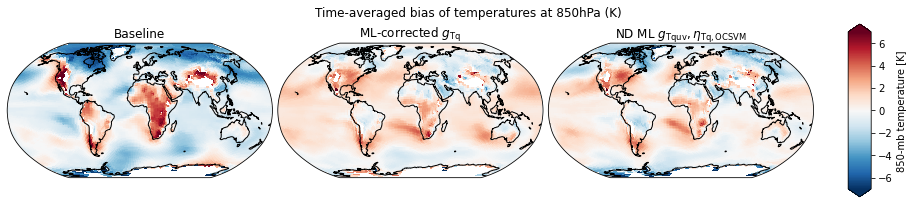

In [25]:
fig, subplots, _, _, _  = fv3viz.plot_cube(
    temp_biases[["ds"]].merge(grid),   
    "ds",
    col="run",
    vmin=-7,
    vmax=7
)
for i, title in enumerate(map_plot_names.values()):
    subplots[0][i].set_title(title)
fig.set_size_inches(16, 3)
fig.suptitle("Time-averaged bias of temperatures at 850hPa (K)")
fig.show()


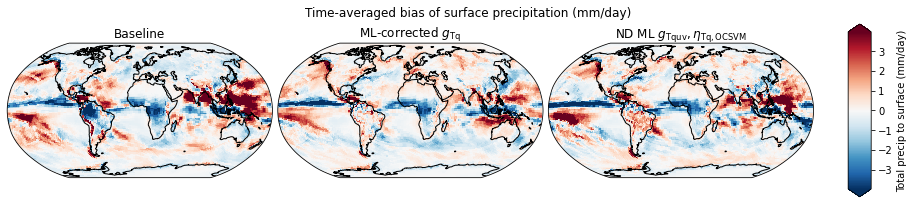

In [26]:
precip_biases = xr.concat(
    [diags_complete[name].total_precip_to_surface_time_mean_bias.assign_coords(common_coords).to_dataset(name="ds") for name in map_plot_names],
    dim=pd.Index(map_plot_names.values(), name="run")
)
fig, subplots, _, cbar, _  = fv3viz.plot_cube(
    precip_biases[["ds"]].merge(grid),   
    "ds",
    col="run",
    # vmin=-7,
    # vmax=7
)
for i, title in enumerate(map_plot_names.values()):
    subplots[0][i].set_title(title)
cbar.set_label("Total precip to surface (mm/day)")
fig.set_size_inches(16, 3)
fig.suptitle("Time-averaged bias of surface precipitation (mm/day)")
fig.show()

## AMS Abstract Figure

In [27]:
ams_map_plot_names = {
    BASELINE_ALG: r"Baseline",
    ML_ONLY_ALG: r"ML without wind or novelty detection",
    OCSVM_DEFAULT: r"ML with wind and novelty detection",
}

In [28]:
ams_temp_biases = xr.concat(
    [diags_complete[name].tmp850_time_mean_bias.assign_coords(common_coords).to_dataset(name="ds") for name in ams_map_plot_names],
    dim=pd.Index(ams_map_plot_names.values(), name="run")
)

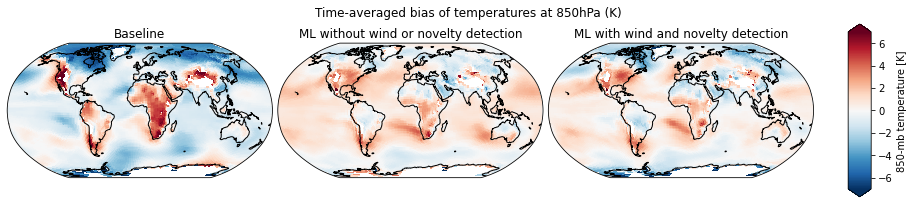

In [29]:
fig, subplots, _, _, _  = fv3viz.plot_cube(
    ams_temp_biases[["ds"]].merge(grid),   
    "ds",
    col="run",
    vmin=-7,
    vmax=7
)
for i, title in enumerate(ams_map_plot_names.values()):
    subplots[0][i].set_title(title)
fig.set_size_inches(16, 3)
fig.suptitle("Time-averaged bias of temperatures at 850hPa (K)")
fig.show()

## Table {tab:metrics-thres}

In [30]:
link_table_run_names = {
    "ocsvm-gamma-4_79-0": r"$\psi_{\mathrm{mask}}",
    "ocsvm-gamma-4_79-0-ramp-0.1": r"$\psi_{\mathrm{ramp}, 0.1}",
    "ocsvm-gamma-4_79-0-ramp-0.25": r"$\psi_{\mathrm{ramp}, 0.25}",
    "ocsvm-gamma-4_79-0-ramp-0.5": r"$\psi_{\mathrm{ramp}, 0.5}",
    "ocsvm-gamma-4_79-0-decay-0.25-0.005": r"$\psi_{\mathrm{decay}, 0.25, 0.005}",
    "ocsvm-gamma-4_79-0-decay-0.25-0.01": r"$\psi_{\mathrm{decay}, 0.25, 0.01}",
    "ocsvm-gamma-4_79-0-decay-0.25-0.02": r"$\psi_{\mathrm{decay}, 0.25, 0.02}",
}

In [31]:
for name in link_table_run_names:
    for metric in table_metrics:
        print(f"{name} {table_metrics}: {metrics[name][metric]}")

KeyError: 'ocsvm-gamma-4_79-0'

## Figure {fig:smooth-nd-map}

In [ ]:
link_map_plot_names = {
    "ocsvm-gamma-4_79-0": r"$\psi_{\mathrm{mask}}$",
    "ocsvm-gamma-4_79-0-ramp-0.25": r"$\psi_{\mathrm{ramp}, 0.25}$",
    "ocsvm-gamma-4_79-0-decay-0.25-0.01": r"$\psi_{\mathrm{decay}, 0.25, 0.01}$",
}

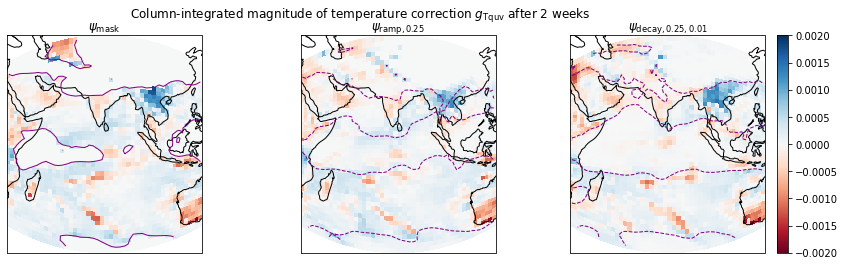

In [ ]:
# fig = plt.figure(figsize=(4, 16))
num_weeks = 2
time_freeze = 4 * 7 * num_weeks

link_ds = xr.concat(
    [diags_3d[name].dQ1.isel(time=time_freeze).sum("z").assign_coords(common_coords).to_dataset(name="correction") for name in link_map_plot_names],
    dim=pd.Index(link_map_plot_names.values(), name="run")
)
link_ds = link_ds.merge(grid)

score = xr.concat(
    [diags[name].centered_score.isel(time=time_freeze*2+1).assign_coords(common_coords).to_dataset(name="score") for name in link_map_plot_names],
    dim=pd.Index(link_map_plot_names.values(), name="run")
)
score = score.merge(grid)

cutoffs = [0, -0.25, -0.25]

tile = 1
fig = plt.figure()
for i, title in enumerate(link_map_plot_names.values()):
    ax = plt.subplot(1, 3, i+1, projection=ccrs.Mercator())
    lon = link_ds.lon.isel(tile=tile)
    im = ax.pcolormesh(lon, link_ds.lat.isel(tile=tile), link_ds.correction.isel(tile=tile, run=i), transform=ccrs.PlateCarree(), vmin=-0.002, vmax=0.002, cmap='RdBu')
    ax.contour(lon, score.lat.isel(tile=tile), score.score.isel(tile=tile, run=i), [cutoffs[i]], transform=ccrs.PlateCarree(), linewidths=1, colors="purple")
    # ax.contourf(lon, score.lat.isel(tile=tile), score.score.isel(tile=tile, run=i), [cutoffs[i], 1000000], transform=ccrs.PlateCarree(), colors="yellow", alpha=0.3)
    ax.set_title(title)
    ax.coastlines()
fig.subplots_adjust(right=0.95)
fig.colorbar(im)
fig.set_size_inches(14, 4)
fig.suptitle(r"Column-integrated magnitude of temperature correction $g_{\mathrm{Tquv}}$ after " + str(num_weeks) + r" weeks")
fig.show()


## Figure {fig:temp-explosion}

In [29]:
max_time = 160
time_sl = slice("2020-01-19", "2020-03-30")
OCSVM_SMALLEST_GAMMA = "ocsvm-gamma-1_79-75pct"
OCSVM_SMALL_GAMMA = "ocsvm-gamma-2_79-75pct"
OCSVM_LARGE_GAMMA = "ocsvm-gamma-8_79-75pct"
table_run_names = {
    ML_ONLY_ALG: r"ML-corrected $g_{\mathrm{Tquv}}$",
    # "minmax-0": r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{T, minmax}}$",
    OCSVM_SMALLEST_GAMMA: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{1}{4 \cdot 79}$",
    OCSVM_DEFAULT: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{4}{79}$",
}


In [30]:
explosion_ds = xr.concat(
    [diags_complete[name].tmp200_zonal_mean_bias for name in table_run_names],
    dim=pd.Index(table_run_names.values(), name="run"),
)

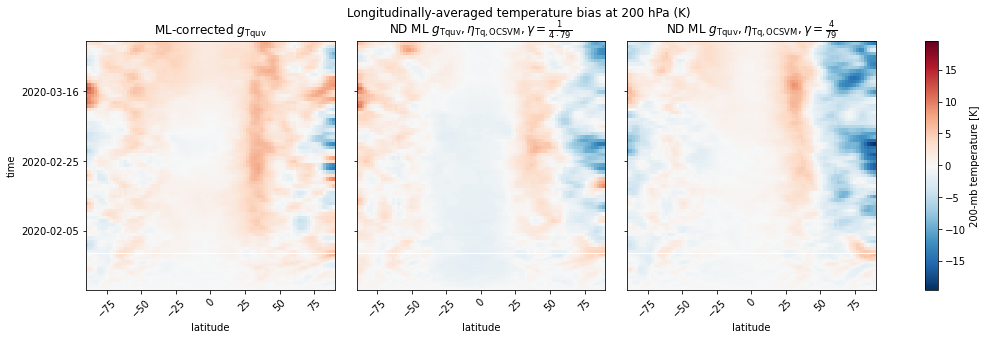

In [31]:
# plt.setp(ax.xaxis.get_majorticklabels(), rotation=50)
im = explosion_ds.sel(time=time_sl).plot(col = "run")
# plt.draw()
for i, title in enumerate(table_run_names.values()):
    im.axes[0][i].set_title(title)
    im.axes[0][i].tick_params(axis='x', labelrotation = 45)
im.fig.set_size_inches(16, 5)
# plt.xticks(rotation = 45)
im.fig.suptitle("Longitudinally-averaged temperature bias at 200 hPa (K)")
plt.show()

## Figure {fig:temp-explosion-novelty}

In [24]:
table_run_names = {
    ML_ONLY_ALG: r"ML-corrected $g_{\mathrm{Tquv}}$",
    # "minmax-0": r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{T, minmax}}$",
    OCSVM_SMALLEST_GAMMA: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{1}{79}$",
    OCSVM_SMALL_GAMMA: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{2}{79}$",
    OCSVM_DEFAULT: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{4}{79}$",
    OCSVM_LARGE_GAMMA: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{8}{79}$",
}

max_time = 160
time_sl = slice("2020-01-19", "2020-03-30")


In [25]:
explosion_ds = xr.concat(
    [diags_complete[name].tmp200_zonal_mean_bias for name in table_run_names],
    dim=pd.Index(table_run_names.values(), name="run"),
)

In [26]:
diags_complete[OCSVM_DEFAULT]

<xarray.Dataset>
Dimensions:                                                         (latitude: 90, pressure: 35, tile: 6, y: 48, x: 48, time: 282, local_time: 24, high_frequency_time: 1679, y_interface: 49, x_interface: 49, longitude: 180, minus_column_integrated_q2_bins: 100, total_precip_to_surface_bins: 100, water_vapor_path_bins: 100)
Coordinates: (12/14)
  * high_frequency_time                                             (high_frequency_time) object ...
  * latitude                                                        (latitude) float64 ...
  * local_time                                                      (local_time) float64 ...
  * longitude                                                       (longitude) float64 ...
  * minus_column_integrated_q2_bins                                 (minus_column_integrated_q2_bins) float64 ...
  * pressure                                                        (pressure) float64 ...
    ...                                                              ...
  * total_precip_to_surface_bins                                    (total_precip_to_surface_bins) float64 ...
  * water_vapor_path_bins                                           (water_vapor_path_bins) float64 ...
  * x                                                               (x) float64 ...
  * x_interface                                                     (x_interface) float64 ...
  * y                                                               (y) float64 ...
  * y_interface                                                     (y_interface) float64 ...
Data variables: (12/958)
    air_temperature_pressure_level_zonal_bias                       (latitude, pressure) float64 ...
    air_temperature_pressure_level_zonal_time_mean                  (latitude, pressure) float64 ...
    area                                                            (tile, y, x) float32 ...
    centered_score_spatial_max_global                               (time) float64 ...
    centered_score_spatial_max_land                                 (time) float64 ...
    centered_score_spatial_max_sea                                  (time) float64 ...
    ...                                                              ...
    water_vapor_path_versus_minus_column_integrated_q2_hist2d_bias  (water_vapor_path_bins, minus_column_integrated_q2_bins) float64 ...
    water_vapor_path_versus_minus_column_integrated_q2_hist_2d      (water_vapor_path_bins, minus_column_integrated_q2_bins) float64 ...
    water_vapor_path_zonal_and_time_mean                            (latitude) float64 ...
    water_vapor_path_zonal_bias                                     (latitude) float64 ...
    water_vapor_path_zonal_mean_bias                                (time, latitude) float64 ...
    water_vapor_path_zonal_mean_value                               (latitude, time) float64 ...
Attributes:
    catalog:           /home/jovyan/fv3net/external/vcm/vcm/catalog.yaml
    command:           save
    history:           /opt/conda/envs/fv3net/bin/prognostic_run_diags save -...
    log_level:         INFO
    n_jobs:            4
    output:            diags.nc
    url:               gs://vcm-ml-experiments/out-of-sample-right-side-up-wi...
    verification:      1yr_pire_postspinup
    verification_url:

In [29]:
explosion_novelty_ds = xr.concat(
    [diags_complete[name].is_novelty_zonal_mean_value if name not in [ML_ONLY_ALG]
    else 0 * diags_complete[name].tmp200_zonal_mean_bias
    for name in table_run_names],
    dim=pd.Index(table_run_names.values(), name="run"),
)

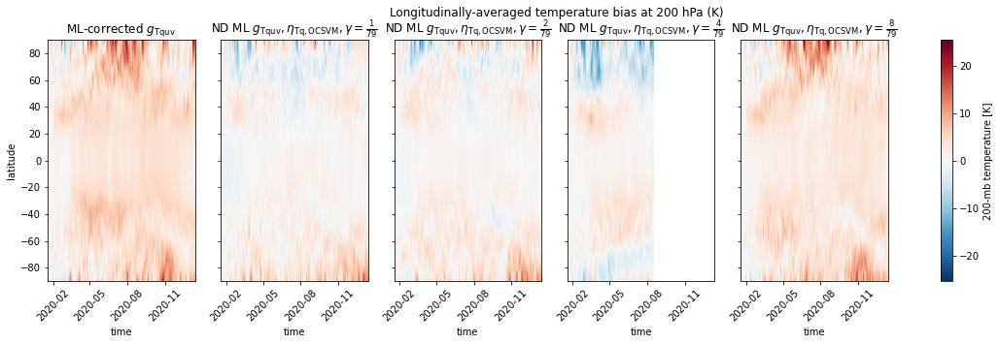

In [31]:
im = explosion_ds.plot(col = "run", x="time")
for i, title in enumerate(table_run_names.values()):
    im.axes[0][i].set_title(title)
    im.axes[0][i].tick_params(axis='x', labelrotation = 45)
im.fig.set_size_inches(16, 5)
im.fig.suptitle(r"Longitudinally-averaged temperature bias at 200 hPa (K)")
im.cbar.set_label("200-mb temperature [K]")
plt.show()

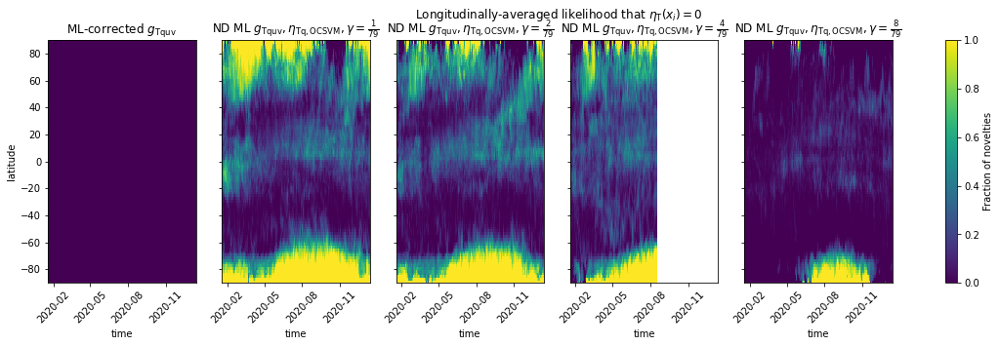

In [32]:
im = explosion_novelty_ds.plot(col = "run", x="time")
for i, title in enumerate(table_run_names.values()):
    im.axes[0][i].set_title(title)
    im.axes[0][i].tick_params(axis='x', labelrotation = 45)
im.fig.set_size_inches(16, 5)
im.fig.suptitle(r"Longitudinally-averaged likelihood that $\eta_{\mathrm{T}}(x_i) = 0$")
im.cbar.set_label("Fraction of novelties")
plt.show()

## % Novelties over time

In [35]:
per_nov_names = {
    # "minmax-0": r"4 $g_{\mathrm{Tq}}, \eta_{\mathrm{T, OCSVM}}$",
    OCSVM_SMALLEST_GAMMA: r"$g_{\mathrm{Tquv}}, \eta_{\mathrm{T, minmax}}, \gamma = \frac{1}{79}$",
    OCSVM_SMALL_GAMMA: r"$g_{\mathrm{Tquv}}, \eta_{\mathrm{T, minmax}}, \gamma = \frac{2}{79}$",
    OCSVM_DEFAULT: r"$g_{\mathrm{Tquv}}, \eta_{\mathrm{T, minmax}}, \gamma = \frac{4}{79}$",
    OCSVM_LARGE_GAMMA: r"$g_{\mathrm{Tquv}}, \eta_{\mathrm{T, minmax}}, \gamma = \frac{8}{79}$",
    # "ocsvm-tq-gamma-4_79-0": r"$g_{\mathrm{Tquv}}, \eta_{\mathrm{T, minmax}}$",
    # "ocsvm-gamma-4_79-0": r"6 $g_{\mathrm{Tquv}}, \eta_{\mathrm{T, OCSVM}}$",
    # "ocsvm-humidity-gamma-4_79-0": r"7 $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}$",
}

In [36]:
diags_complete[OCSVM_DEFAULT]

<xarray.Dataset>
Dimensions:                                                         (latitude: 90, pressure: 35, tile: 6, y: 48, x: 48, time: 282, local_time: 24, high_frequency_time: 1679, y_interface: 49, x_interface: 49, longitude: 180, minus_column_integrated_q2_bins: 100, total_precip_to_surface_bins: 100, water_vapor_path_bins: 100)
Coordinates: (12/14)
  * high_frequency_time                                             (high_frequency_time) object ...
  * latitude                                                        (latitude) float64 ...
  * local_time                                                      (local_time) float64 ...
  * longitude                                                       (longitude) float64 ...
  * minus_column_integrated_q2_bins                                 (minus_column_integrated_q2_bins) float64 ...
  * pressure                                                        (pressure) float64 ...
    ...                                                              ...
  * total_precip_to_surface_bins                                    (total_precip_to_surface_bins) float64 ...
  * water_vapor_path_bins                                           (water_vapor_path_bins) float64 ...
  * x                                                               (x) float64 ...
  * x_interface                                                     (x_interface) float64 ...
  * y                                                               (y) float64 ...
  * y_interface                                                     (y_interface) float64 ...
Data variables: (12/958)
    air_temperature_pressure_level_zonal_bias                       (latitude, pressure) float64 ...
    air_temperature_pressure_level_zonal_time_mean                  (latitude, pressure) float64 ...
    area                                                            (tile, y, x) float32 ...
    centered_score_spatial_max_global                               (time) float64 ...
    centered_score_spatial_max_land                                 (time) float64 ...
    centered_score_spatial_max_sea                                  (time) float64 ...
    ...                                                              ...
    water_vapor_path_versus_minus_column_integrated_q2_hist2d_bias  (water_vapor_path_bins, minus_column_integrated_q2_bins) float64 ...
    water_vapor_path_versus_minus_column_integrated_q2_hist_2d      (water_vapor_path_bins, minus_column_integrated_q2_bins) float64 ...
    water_vapor_path_zonal_and_time_mean                            (latitude) float64 ...
    water_vapor_path_zonal_bias                                     (latitude) float64 ...
    water_vapor_path_zonal_mean_bias                                (time, latitude) float64 ...
    water_vapor_path_zonal_mean_value                               (latitude, time) float64 ...
Attributes:
    catalog:           /home/jovyan/fv3net/external/vcm/vcm/catalog.yaml
    command:           save
    history:           /opt/conda/envs/fv3net/bin/prognostic_run_diags save -...
    log_level:         INFO
    n_jobs:            4
    output:            diags.nc
    url:               gs://vcm-ml-experiments/out-of-sample-right-side-up-wi...
    verification:      1yr_pire_postspinup
    verification_url:

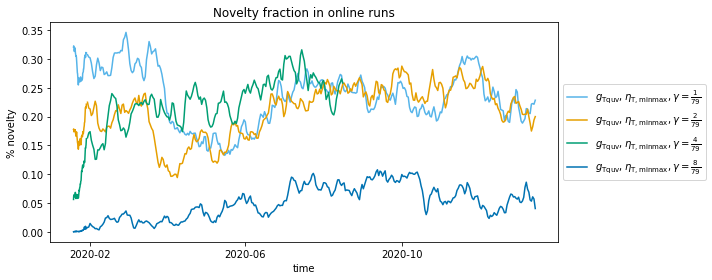

In [37]:
plt.figure(figsize=(10, 4), tight_layout=True)
for name, label in per_nov_names.items():
    diags_complete[name].is_novelty_spatial_mean_global.plot(label=label)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Novelty fraction in online runs")
plt.ylabel("% novelty")
plt.show()

## Figure {fig:temp-explosion-map}

In [48]:
time_sl_before_crash = slice("2020-01-19", "2020-02-26")

explosion_ds_map = xr.concat(
    [(atmos[name].TMP200 - validation.TMP200).sel(time=time_sl_before_crash).mean("time").rename({"grid_xt": "x", "grid_yt": "y"}).assign_coords(common_coords) for name in table_run_names],
    dim=pd.Index(table_run_names.values(), name="run"),
)

In [46]:
# explosion_ds_map_all_time.to_dataset(name="ds").merge(grid)

<xarray.Dataset>
Dimensions:      (tile: 6, x: 48, y: 48, run: 3, y_interface: 49, x_interface: 49)
Coordinates:
  * tile         (tile) int64 0 1 2 3 4 5
  * x            (x) int64 0 1 2 3 4 5 6 7 8 9 ... 38 39 40 41 42 43 44 45 46 47
  * y            (y) int64 0 1 2 3 4 5 6 7 8 9 ... 38 39 40 41 42 43 44 45 46 47
  * run          (run) object 'ND ML $g_{\\mathrm{Tquv}}, \\eta_{\\mathrm{Tq,...
  * x_interface  (x_interface) float64 1.0 2.0 3.0 4.0 ... 46.0 47.0 48.0 49.0
  * y_interface  (y_interface) float64 1.0 2.0 3.0 4.0 ... 46.0 47.0 48.0 49.0
Data variables:
    ds           (run, tile, y, x) float32 dask.array<chunksize=(1, 6, 48, 48), meta=np.ndarray>
    area         (tile, y, x) float32 2.355e+10 2.398e+10 ... 2.355e+10
    lat          (tile, y, x) float32 -34.89 -35.6 -36.29 ... -36.74 -36.01
    latb         (tile, y_interface, x_interface) float32 -35.26 ... -35.26
    lon          (tile, y, x) float32 305.8 307.4 309.0 ... 31.79 33.41 35.0
    lonb         (tile, y_interface, x_interface) float32 305.0 306.6 ... 35.0

<xarray.Dataset>
Dimensions:      (time: 432, latitude: 90, run: 3, tile: 6, y: 48, x: 48, y_interface: 49, x_interface: 49)
Coordinates:
  * time         (time) object 2020-01-19 03:00:00 ... 2021-01-13 00:00:00
  * latitude     (latitude) float64 -89.0 -87.0 -85.0 -83.0 ... 85.0 87.0 89.0
  * run          (run) object 'ML-corrected $g_{\\mathrm{Tquv}}$' ... 'ND ML ...
  * x            (x) int64 0 1 2 3 4 5 6 7 8 9 ... 38 39 40 41 42 43 44 45 46 47
  * x_interface  (x_interface) float64 1.0 2.0 3.0 4.0 ... 46.0 47.0 48.0 49.0
  * y            (y) int64 0 1 2 3 4 5 6 7 8 9 ... 38 39 40 41 42 43 44 45 46 47
  * y_interface  (y_interface) float64 1.0 2.0 3.0 4.0 ... 46.0 47.0 48.0 49.0
  * tile         (tile) int64 0 1 2 3 4 5
Data variables:
    ds           (run, time, latitude) float32 -0.2283 -0.02496 ... nan nan
    area         (tile, y, x) float32 2.355e+10 2.398e+10 ... 2.355e+10
    lat          (tile, y, x) float32 -34.89 -35.6 -36.29 ... -36.74 -36.01
    latb         (tile, y_interface, x_interface) float32 -35.26 ... -35.26
    lon          (tile, y, x) float32 305.8 307.4 309.0 ... 31.79 33.41 35.0
    lonb         (tile, y_interface, x_interface) float32 305.0 306.6 ... 35.0

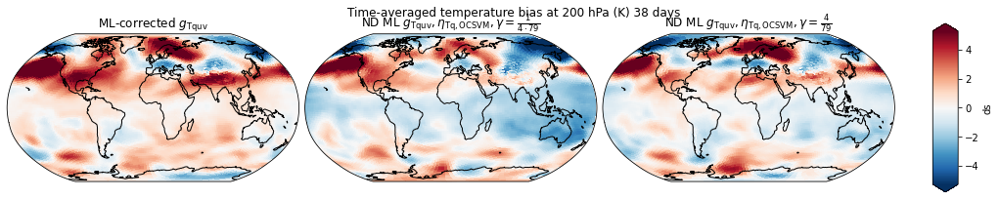

In [49]:
# explosion_ds.to_dataset(name="ds").merge(grid)
# explosion_ds = xr.concat(
#     [diags_complete[name].tmp200_zonal_mean_bias for name in table_run_names],
#     dim=pd.Index(table_run_names.values(), name="run"),
# )
fig, subplots, _, _, _  = fv3viz.plot_cube(
    explosion_ds_map.to_dataset(name="ds").merge(grid),   
    "ds",
    col="run",
)
for i, title in enumerate(table_run_names.values()):
    subplots[0][i].set_title(title)
fig.set_size_inches(18, 3)
fig.suptitle("Time-averaged temperature bias at 200 hPa (K) 38 days")
fig.show()


In [44]:
table_run_novelty_names = {
    # "minmax-0": r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{T, minmax}}$",
    OCSVM_SMALLEST_GAMMA: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{1}{79}$",
    OCSVM_DEFAULT: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{4}{79}$",
    OCSVM_LARGE_GAMMA: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}, \gamma=\frac{8}{79}$",
}

explosion_ds_map_all_time = xr.concat(
    [(atmos[name].TMP200 - validation.TMP200).mean("time").rename({"grid_xt": "x", "grid_yt": "y"}).assign_coords(common_coords) for name in table_run_novelty_names],
    dim=pd.Index(table_run_novelty_names.values(), name="run"),
)

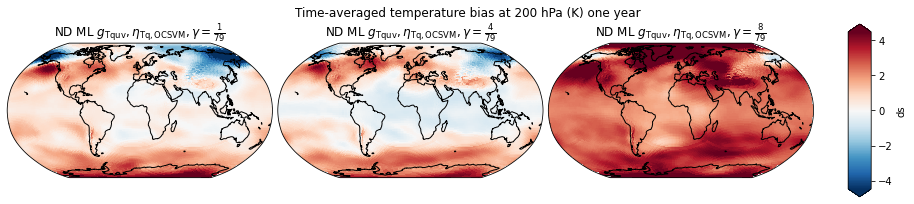

In [45]:
fig, subplots, _, _, _  = fv3viz.plot_cube(
    explosion_ds_map_all_time.to_dataset(name="ds").merge(grid),   
    "ds",
    col="run",
)
for i, title in enumerate(table_run_novelty_names.values()):
    subplots[0][i].set_title(title)
fig.set_size_inches(16, 3)
fig.suptitle("Time-averaged temperature bias at 200 hPa (K) one year")
fig.show()


## Figure {fig:total-water-path}

In [50]:
run_names = {
    BASELINE_ALG: r"Baseline",
    ML_ONLY_ALG: r"ML-corrected $g_{\mathrm{Tq}}$",
    OCSVM_DEFAULT: r"ND ML $g_{\mathrm{Tquv}}, \eta_{\mathrm{Tq, OCSVM}}$",
}

In [51]:
diags_complete["baseline"]

<xarray.Dataset>
Dimensions:                                                         (latitude: 90, pressure: 35, tile: 6, y: 48, x: 48, time: 432, local_time: 24, high_frequency_time: 2879, y_interface: 49, x_interface: 49, longitude: 180, minus_column_integrated_q2_bins: 100, total_precip_to_surface_bins: 100, water_vapor_path_bins: 100)
Coordinates: (12/14)
  * high_frequency_time                                             (high_frequency_time) object ...
  * latitude                                                        (latitude) float64 ...
  * local_time                                                      (local_time) float64 ...
  * longitude                                                       (longitude) float64 ...
  * minus_column_integrated_q2_bins                                 (minus_column_integrated_q2_bins) float64 ...
  * pressure                                                        (pressure) float64 ...
    ...                                                              ...
  * total_precip_to_surface_bins                                    (total_precip_to_surface_bins) float64 ...
  * water_vapor_path_bins                                           (water_vapor_path_bins) float64 ...
  * x                                                               (x) float64 ...
  * x_interface                                                     (x_interface) float64 ...
  * y                                                               (y) float64 ...
  * y_interface                                                     (y_interface) float64 ...
Data variables: (12/926)
    air_temperature_pressure_level_zonal_bias                       (latitude, pressure) float64 ...
    air_temperature_pressure_level_zonal_time_mean                  (latitude, pressure) float64 ...
    area                                                            (tile, y, x) float32 ...
    column_int_dqu_spatial_max_global                               (time) float32 ...
    column_int_dqu_spatial_max_land                                 (time) float32 ...
    column_int_dqu_spatial_max_sea                                  (time) float32 ...
    ...                                                              ...
    water_vapor_path_versus_minus_column_integrated_q2_hist2d_bias  (water_vapor_path_bins, minus_column_integrated_q2_bins) float64 ...
    water_vapor_path_versus_minus_column_integrated_q2_hist_2d      (water_vapor_path_bins, minus_column_integrated_q2_bins) float64 ...
    water_vapor_path_zonal_and_time_mean                            (latitude) float64 ...
    water_vapor_path_zonal_bias                                     (latitude) float64 ...
    water_vapor_path_zonal_mean_bias                                (time, latitude) float64 ...
    water_vapor_path_zonal_mean_value                               (latitude, time) float64 ...
Attributes:
    catalog:           /home/jovyan/fv3net/external/vcm/vcm/catalog.yaml
    command:           save
    history:           /opt/conda/envs/fv3net/bin/prognostic_run_diags save -...
    log_level:         INFO
    n_jobs:            5
    output:            diags.nc
    url:               gs://vcm-ml-experiments/claytons/2022-08-10/baseline-t...
    verification:      1yr_pire_postspinup
    verification_url:

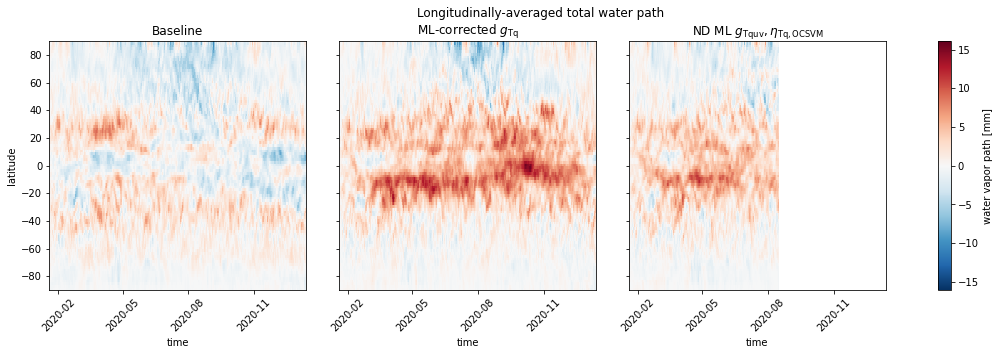

In [52]:
ds = xr.concat(
    [diags_complete[name].water_vapor_path_zonal_mean_bias for name in run_names],
    dim=pd.Index(run_names.values(), name="run"),
)
im = ds.plot(col = "run", x="time")
for i, title in enumerate(run_names.values()):
    im.axes[0][i].set_title(title)
    im.axes[0][i].tick_params(axis='x', labelrotation = 45)
im.fig.set_size_inches(16, 5)
im.fig.suptitle(r"Longitudinally-averaged total water path")
plt.show()

## Figure {fig:zonal-mean-temp-bias}

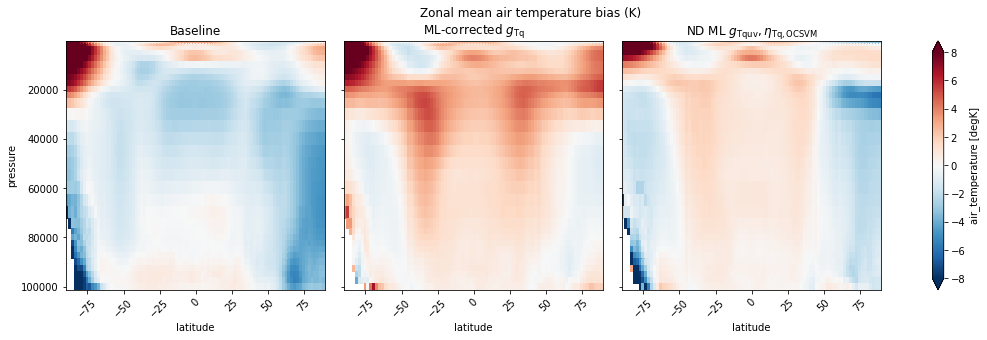

In [53]:
ds = xr.concat(
    [diags_complete[name].air_temperature_pressure_level_zonal_bias for name in run_names],
    dim=pd.Index(run_names.values(), name="run"),
)
im = ds.plot(col = "run", x="latitude", vmax=8, vmin=-8, cmap="RdBu_r")
for i, title in enumerate(run_names.values()):
    im.axes[0][i].set_title(title)
    im.axes[0][i].tick_params(axis='x', labelrotation = 45)
im.fig.set_size_inches(16, 5)
im.fig.suptitle(r"Zonal mean air temperature bias (K)")
plt.gca().invert_yaxis()
plt.show()

## Figure {fig:params}

In [37]:
# minmax_names = get_names_alg("minmax")
# minmax_cutoffs = [runs[i]["cutoff"] for i in runs if i in minmax_names]
CUTOFF = "cutoff_true"
ocsvm_large_names = get_names_alg("ocsvm", gamma=8/79)
ocsvm_large_cutoffs = [runs[i][CUTOFF] for i in runs if i in ocsvm_large_names]
ocsvm_default_names = get_names_alg("ocsvm", gamma=4/79)
ocsvm_default_cutoffs = [runs[i][CUTOFF] for i in runs if i in ocsvm_default_names]
ocsvm_small_names = get_names_alg("ocsvm", gamma=2/79)
ocsvm_small_cutoffs = [runs[i][CUTOFF] for i in runs if i in ocsvm_small_names]
ocsvm_smallest_names = get_names_alg("ocsvm", gamma=1/79)
ocsvm_smallest_cutoffs = [runs[i][CUTOFF] for i in runs if i in ocsvm_smallest_names]
# print(ocsvm_default_names)

ocsvm_names = {
    8/79: ocsvm_large_names,
    4/79: ocsvm_default_names,
    2/79: ocsvm_small_names,
    1/79: ocsvm_smallest_names
}
ocsvm_cutoffs = {
    8/79: ocsvm_large_cutoffs,
    4/79: ocsvm_default_cutoffs,
    2/79: ocsvm_small_cutoffs,
    1/79: ocsvm_smallest_cutoffs
}
# minmax_names_bp = get_names_alg("minmax", include_bp=True)
ocsvm_large_names_bp = get_names_alg("ocsvm", gamma=8/79, include_bp=True)
ocsvm_default_names_bp = get_names_alg("ocsvm", gamma=4/79, include_bp=True)
ocsvm_small_names_bp = get_names_alg("ocsvm", gamma=2/79, include_bp=True)
ocsvm_smallest_names_bp = get_names_alg("ocsvm", gamma=1/79, include_bp=True)

ocsvm_names_bp = {
    8/79: ocsvm_large_names_bp,
    4/79: ocsvm_default_names_bp,
    2/79: ocsvm_small_names_bp,
    1/79: ocsvm_smallest_names_bp
}

gamma_strs = {
    8/79: r"$\gamma = \frac{8}{79}$",
    4/79: r"$\gamma = \frac{4}{79}$",
    2/79: r"$\gamma = \frac{2}{79}$",
    1/79: r"$\gamma = \frac{1}{79}$",
}

metric_strs = ["rmse_of_time_mean/tmp850", "rmse_of_time_mean/total_precip_to_surface", "rmse_of_time_mean/pwat"]
metric_names = ["RMSE T (K)", "RMSE SP (mm/day)", "RMSE PWAT (kg/$\mathrm{m}^2)$"]


In [38]:

def sensitivity_tests(has_bp, one_plot):
        if one_plot:
                assert not has_bp
                fig = plt.figure(figsize=(5, 12))
                for gamma in [1/79, 2/79, 4/79, 8/79]:
                        # fig.suptitle(f"{metric_str} for {names[i]}")

                        for i, metric_str in enumerate(metric_strs):
                                ax = plt.subplot(3, 1, i+1)
                                metric = [metrics[j][metric_str]["value"] for j in ocsvm_names[gamma]]
                                novelty_fracs, metric_online = zip(*sorted(zip([novelty_fractions[name] for name in ocsvm_names[gamma]], metric)))
                                ax.plot(novelty_fracs, metric_online, label=r"$\eta_{\mathrm{T, OCSVM}}$, " +  gamma_strs[gamma] + r"")
                                ax.scatter([novelty_fractions[name] for name in ocsvm_names[gamma]], metric)
                                ax.set_ylabel(metric_names[i])
                                # ax.set_xlabel("% novelties detected")
                                if i == 0:
                                        ax.set_title(r"Novelty detection metrics as cutoff $\xi$ varies")
                                if i == 2:
                                        ax.set_xlabel("Fraction of novelties from one year")

                plt.legend()
                plt.show()
        else:

                for gamma in [1/79, 2/79, 4/79, 8/79]:
                        fig = plt.figure(figsize=(5, 12))
                        # fig.suptitle(f"{metric_str} for {names[i]}")

                        for i, metric_str in enumerate(metric_strs):

                                ax = plt.subplot(3, 1, i+1)
                                metric = [metrics[j][metric_str]["value"] for j in ocsvm_names[gamma]]
                                metric_bp = [metrics[j][metric_str]["value"] for j in ocsvm_names_bp[gamma]]
                                novelty_fracs, metric_bp_online = zip(*sorted(zip([novelty_fractions[name] for name in ocsvm_names_bp[gamma]], metric_bp)))
                                ax.plot(novelty_fracs, metric_bp_online, c="gray")
                                ax.scatter([novelty_fractions[name] for name in ocsvm_names[gamma]], metric, label="OCSVM ND")
                                if has_bp:
                                        ax.scatter([novelty_fractions[ML_ONLY_ALG]], [metrics[ML_ONLY_ALG][metric_str]["value"]], label="No ND")
                                        ax.scatter([novelty_fractions[BASELINE_ALG]], [metrics[BASELINE_ALG][metric_str]["value"]], label="Baseline")
                                ax.set_ylabel(metric_names[i])
                                # ax.set_xlabel("% novelties detected")
                                if i == 0:
                                        ax.set_title(r"ND ML metrics with $\eta_{\mathrm{T, OCSVM}}$, " +  gamma_strs[gamma] + r", cutoff $\xi$")
                                        if has_bp:
                                                plt.legend()
                                if i == 2:
                                        ax.set_xlabel("Fraction of novelties from one year")

                        plt.show()


<ipython-input-38-e58f4670fbe6>:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.subplot(3, 1, i+1)


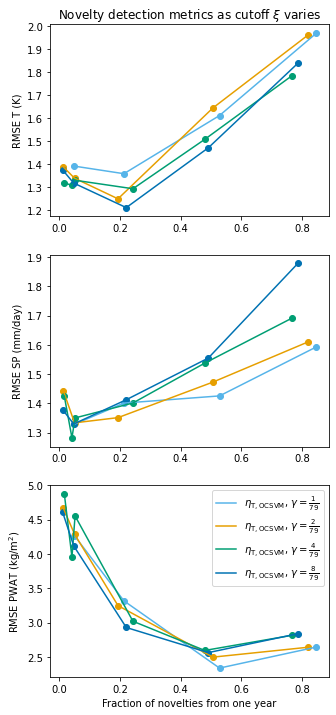

In [42]:
sensitivity_tests(False, True)

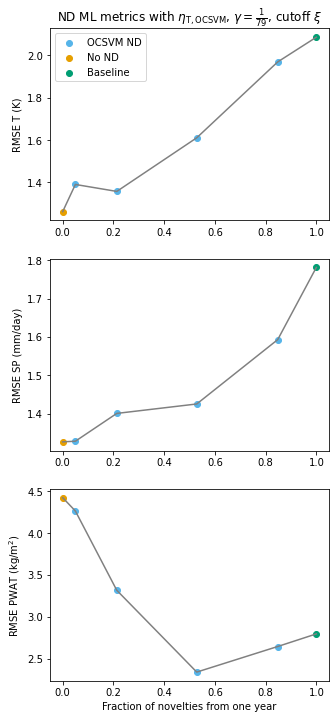

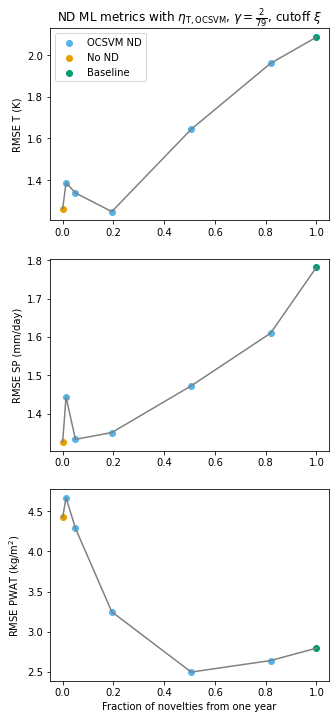

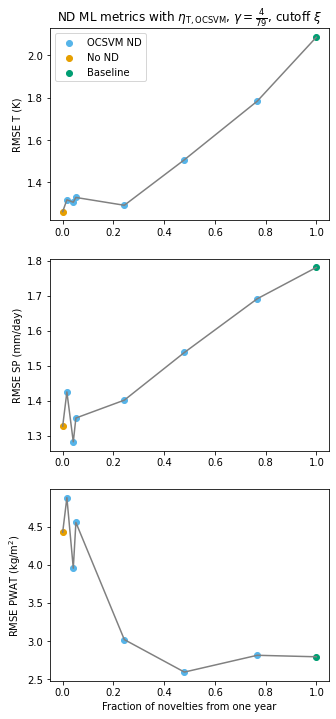

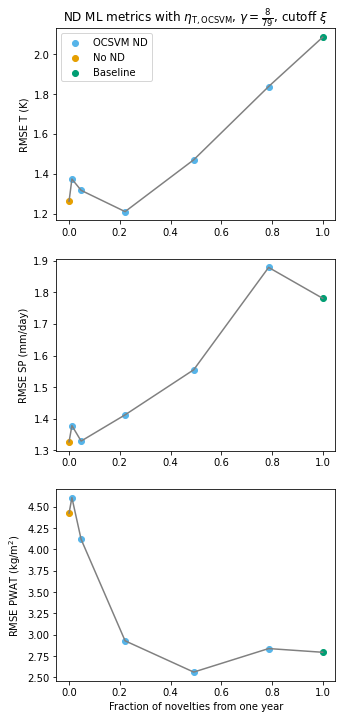

In [44]:
sensitivity_tests(True, False)

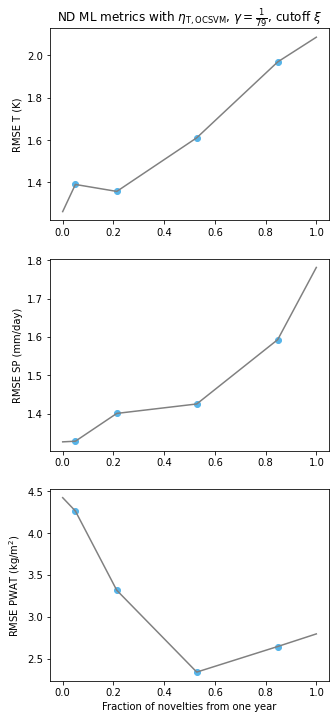

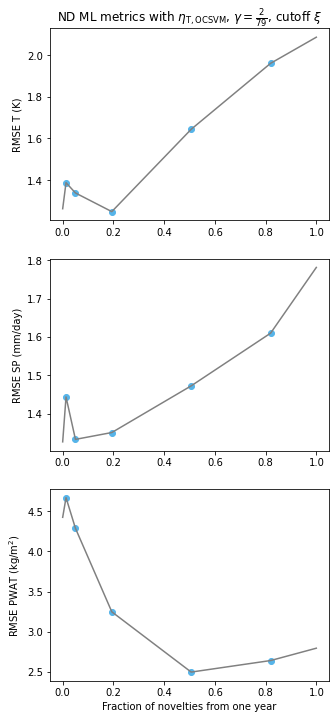

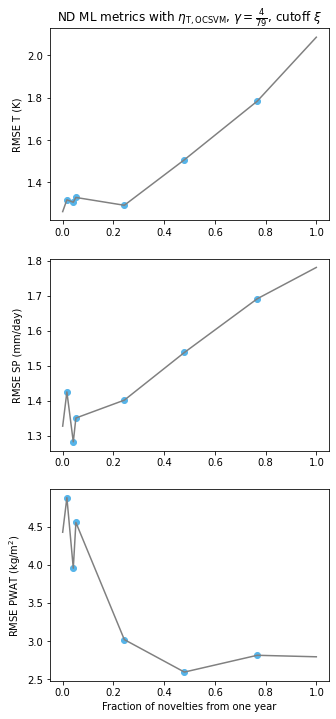

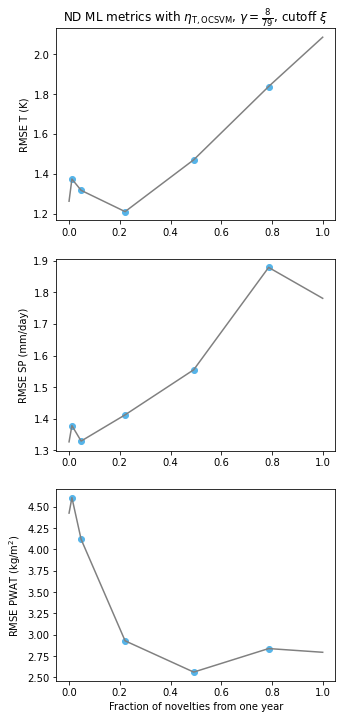

In [45]:
sensitivity_tests(False, False)

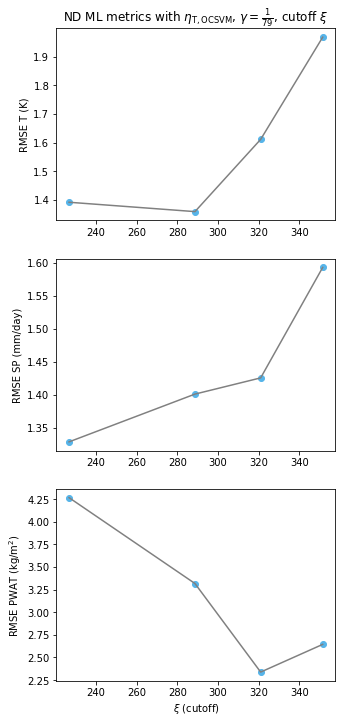

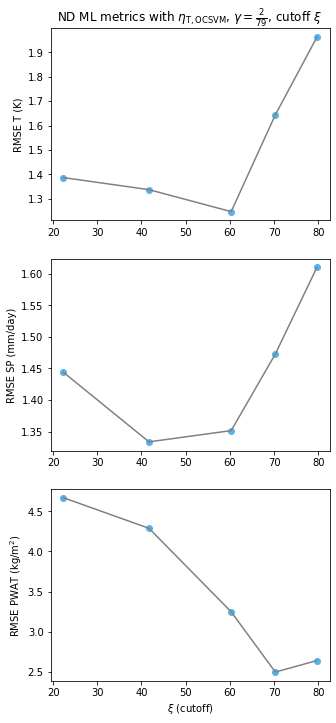

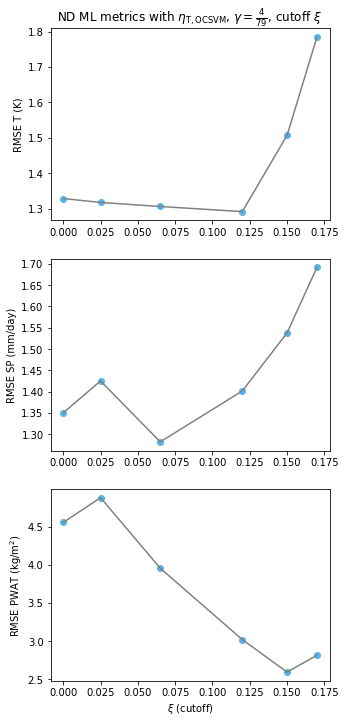

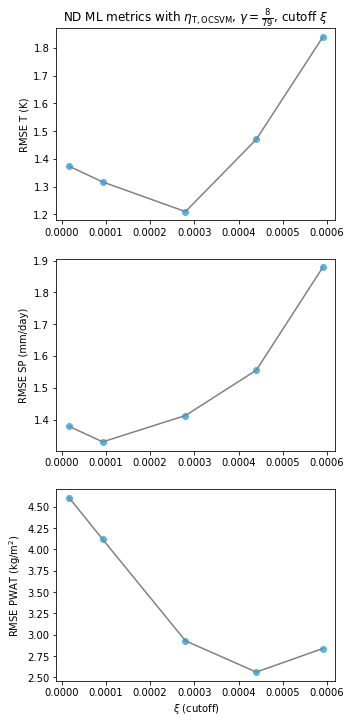

In [46]:

for gamma in [1/79, 2/79, 4/79, 8/79]:

    fig = plt.figure(figsize=(5, 12))

    for i, metric_str in enumerate(metric_strs):
        ax = plt.subplot(3, 1, i+1)

        metric = [metrics[j][metric_str]["value"] for j in ocsvm_names[gamma]]
        # print(metric)
        # print(ocsvm_cutoffs[gamma])
        ax.scatter(ocsvm_cutoffs[gamma], metric)
        ax.plot(ocsvm_cutoffs[gamma], metric, c="gray")
        # ax.invert_xaxis()
        ax.set_ylabel(metric_names[i])
        if i == 0:
            ax.set_title(r"ND ML metrics with $\eta_{\mathrm{T, OCSVM}}$, " +  gamma_strs[gamma] + r", cutoff $\xi$")
        if i == 2:
            ax.set_xlabel(r"$\xi$ (cutoff)")

    # plt.suptitle(r"Metrics for Prog. ND with $\eta_{\mathrm{t, OCSVM}}$, cutoff $\nu + \Delta \nu$")
    plt.show()

## Interpretability over time

In [47]:
ak = [
  300, 646.715942382812, 1045.22229003906, 1469.18811035156,
    1897.82861328125, 2325.384765625, 2754.3955078125, 3191.29443359375,
    3648.33203125, 4135.67529296875, 4668.2822265625, 5247.93994140625,
    5876.2705078125, 6554.71630859375, 7284.521484375, 8066.73779296875,
    8902.1875, 9791.482421875, 10734.9853515625, 11626.2529296875,
    12372.123046875, 12990.4072265625, 13496.29296875, 13902.765625,
    14220.982421875, 14460.5810546875, 14629.9306640625, 14736.3271484375,
    14786.1748046875, 14785.1064453125, 14738.1181640625, 14649.65625,
    14523.6982421875, 14363.81640625, 14173.2412109375, 13954.9072265625,
    13711.4775390625, 13445.3955078125, 13158.904296875, 12854.0693359375,
    12532.80078125, 12196.8544921875, 11847.880859375, 11487.3916015625,
    11116.8232421875, 10737.484375, 10350.625, 9957.39453125, 9558.875,
    9156.0693359375, 8749.921875, 8341.3154296875, 7931.06494140625,
    7519.94189453125, 7108.64794921875, 6698.28076171875, 6290.0068359375,
    5884.984375, 5484.3720703125, 5089.31884765625, 4700.96044921875,
    4320.4208984375, 3948.80688476562, 3587.201171875, 3236.66625976562,
    2898.23681640625, 2572.91235351562, 2261.66650390625, 1965.42407226562,
    1685.07934570312, 1421.47912597656, 1175.41882324219, 947.651550292969,
    738.868774414062, 549.712951660156, 380.762573242188, 232.541656494141,
    105.481033325195, -0.000838190317153931, 0]
bk = [
  0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
    0.00106594723183662, 0.00412866193801165, 0.00900663062930107,
    0.015542627312243, 0.0235992092639208, 0.033054806292057,
    0.043801199644804, 0.05574094876647, 0.0687855407595634,
    0.0828534662723541, 0.0978698134422302, 0.113764345645905,
    0.130471020936966, 0.147927477955818, 0.166074603796005,
    0.184855818748474, 0.204216599464417, 0.224105268716812,
    0.24447163939476, 0.265267163515091, 0.286444991827011,
    0.307960391044617, 0.329770147800446, 0.351832032203674,
    0.374106198549271, 0.396553158760071, 0.419136375188828,
    0.441819369792938, 0.464568197727203, 0.487349987030029,
    0.510133802890778, 0.532889664173126, 0.555589437484741,
    0.578206658363342, 0.600715756416321, 0.623093605041504,
    0.645294427871704, 0.6672682762146, 0.688964784145355, 0.710333287715912,
    0.73132312297821, 0.751883804798126, 0.771965146064758,
    0.791517317295074, 0.810491323471069, 0.828839004039764,
    0.846513032913208, 0.863467633724213, 0.879658281803131,
    0.89504212141037, 0.909577906131744, 0.923226416110992,
    0.935950636863708, 0.947715699672699, 0.958489239215851,
    0.968241274356842, 0.976944744586945, 0.98457533121109,
    0.991112649440765, 0.996537208557129, 1]

# reference pressure levels in hPa assuming 1000hPa surface pressure
plev = np.array(ak)/100 + np.array(bk) * 1000  
plev_mid = 0.5 * (plev[:-1] + plev[1:])

In [48]:
from scipy.interpolate import interp1d

f = interp1d(plev_mid, range(0, 79), fill_value='extrapolate')
tick_labels = [3, 100, 300, 500, 700, 850, 1000]
tick_indices = f(tick_labels)

In [49]:
# import hashlib

# def get_offline_diags(novelty_detector, nd_path, testing_ds, testing_ds_name: str) -> xr.Dataset:
#     """
#     Returns a dataset containing the is_novelty and novelty_score fields that reflect
#     the offline behavior of a novelty detector on some other temporal dataset.
#     """
#     diags_url = os.path.join(
#         nd_path,
#         f"diags_novelty_offline_truncated/{hashlib.md5(testing_ds_name.encode()).hexdigest()}",
#     )
#     fs = vcm.cloud.get_fs(diags_url)
#     if fs.exists(diags_url):
#         print(
#             f"Reading offline novelty data from "
#             + f"previous computation, at {diags_url}."
#         )
#         diags = xr.open_zarr(fsspec.get_mapper(diags_url))
#     else:
#         print(f"Computing offline novelty data from states from {testing_ds_name}.")
#         _, diags = novelty_detector.predict_novelties(testing_ds)
#         mapper = fsspec.get_mapper(diags_url)
#         diags.to_zarr(mapper, mode="w", consolidated=True)
#         print(f"Saved online novelty data to {diags_url}.")
#     return diags

In [50]:
def get_offline_diags(nd_path, dataset_name) -> xr.Dataset:
    """
    Returns a dataset containing the is_novelty and novelty_score fields that reflect
    the offline behavior of a novelty detector on some other temporal dataset.
    """
    if dataset_name == BASELINE_ALG:
        ds_hash = "61c5f8380a6560540d65ba0b9b9fb41c"
    elif dataset_name == ML_ONLY_ALG:
        ds_hash = "286d3f0e7fcb9b8ce3f8d3a61299c85f"
    diags_url = os.path.join(nd_path, "diags_novelty_offline", ds_hash)
    diags = xr.open_zarr(fsspec.get_mapper(diags_url))
    return diags

In [51]:
crashed_states = states[ML_ONLY_ALG]
baseline_states = states[BASELINE_ALG]

In [52]:
novelty_detector_paths = {
    # "minmax_t": "gs://vcm-ml-experiments/claytons/2022-07-13/oos-test/novelty",
    # "minmax_tq": "gs://vcm-ml-experiments/claytons/2022-07-20/tq-combined-nd-trial-2/trained_models/minmax",
    # "ocsvm_t_large_gamma": "gs://vcm-ml-experiments/claytons/2022-07-18/ocsvm-gamma-trial-1/trained_models/ocsvm-large",
    # OCSVM_LARGE_GAMMA: "gs://vcm-ml-experiments/claytons/2023-02-13/tq-additional-ocsvms-trial-3/trained_models/ocsvm-tq-gamma-8_79-nu-4e-6",
    OCSVM_DEFAULT: "gs://vcm-ml-experiments/claytons/2022-08-09/tq-combined-nd-trial-1/trained_models/ocsvm-larger-gamma",
    # OCSVM_SMALL_GAMMA: "gs://vcm-ml-experiments/claytons/2023-02-08/tq-additional-ocsvms-trial-2/trained_models/ocsvm-tq-gamma-2_79-nu-5e-3",
    # OCSVM_SMALLEST_GAMMA: "gs://vcm-ml-experiments/claytons/2023-02-08/tq-additional-ocsvms-trial-2/trained_models/ocsvm-tq-gamma-1_79-nu-5e-3",
}
nd_names = {
    # OCSVM_LARGE_GAMMA: r"$\eta_{\mathrm{Tq, OCSVM}}, \gamma = \frac{8}{79}$",
    OCSVM_DEFAULT: r"$\eta_{\mathrm{Tq, OCSVM}}, \gamma = \frac{4}{79}$",
    # OCSVM_SMALL_GAMMA: r"$\eta_{\mathrm{Tq, OCSVM}}, \gamma = \frac{2}{79}$",
    # OCSVM_SMALLEST_GAMMA: r"$\eta_{\mathrm{Tq, OCSVM}}, \gamma = \frac{1}{79}$",
    # "ocsvm_t_large_gamma": r"$\eta_{\mathrm{T, OCSVM}}, \gamma = \frac{4}{79}$",
    # "ocsvm_t_small_gamma": r"$\eta_{\mathrm{T, OCSVM}}, \gamma = \frac{1}{4 \cdot 79}$",
    # "minmax_t": r"$\eta_{\mathrm{T, minmax}}$",
    # "minmax_tq": r"$\eta_{\mathrm{Tq, minmax}}$",
}


In [53]:
diags_default = get_offline_diags(novelty_detector_paths[OCSVM_DEFAULT], ML_ONLY_ALG)
# diags_small = get_offline_diags(novelty_detector_paths[OCSVM_SMALL_GAMMA], ML_ONLY_ALG)

In [54]:
diags_default.is_novelty.time.max().values

array(cftime.DatetimeJulian(2020, 5, 10, 0, 0, 0, 0, has_year_zero=False),
      dtype=object)

In [55]:
diags_default.is_novelty.time.min().values

array(cftime.DatetimeJulian(2020, 1, 19, 0, 0, 0, 0, has_year_zero=False),
      dtype=object)

In [56]:
time_sl = slice("2020-01-19", "2020-05-10")

In [57]:
common_coords = {"tile": range(6), "x": range(48), "y": range(48)}
grid = catalog["grid/c48"].read().assign_coords(common_coords)

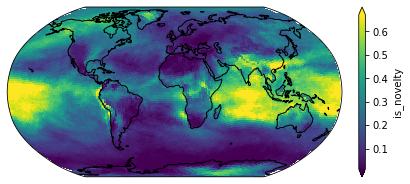

In [58]:

fig, subplots, _, _, _  = fv3viz.plot_cube(
    diags_default.merge(grid).mean("time"),   
    "is_novelty",
)
# for i, title in enumerate(table_run_names.values()):
#     subplots[0][i].set_title(title)
# fig.set_size_inches(18, 3)
# fig.suptitle("Time-averaged temperature bias at 200 hPa (K) 38 days")
# fig.show()

In [36]:
fig, subplots, _, _, _  = fv3viz.plot_cube(
    diags_small.merge(grid).mean("time"),   
    "is_novelty",
)

NameError: name 'diags_small' is not defined

In [ ]:
diags_default.merge(grid)

<xarray.Dataset>
Dimensions:         (tile: 6, y: 48, x: 48, time: 225, y_interface: 49, x_interface: 49)
Coordinates:
  * tile            (tile) int64 0 1 2 3 4 5
  * y               (y) int64 0 1 2 3 4 5 6 7 8 9 ... 39 40 41 42 43 44 45 46 47
  * x               (x) int64 0 1 2 3 4 5 6 7 8 9 ... 39 40 41 42 43 44 45 46 47
  * time            (time) object 2020-01-19 00:00:00 ... 2020-05-10 00:00:00
  * x_interface     (x_interface) float64 1.0 2.0 3.0 4.0 ... 47.0 48.0 49.0
  * y_interface     (y_interface) float64 1.0 2.0 3.0 4.0 ... 47.0 48.0 49.0
Data variables:
    centered_score  (time, tile, y, x) float64 dask.array<chunksize=(57, 3, 24, 24), meta=np.ndarray>
    is_novelty      (time, tile, y, x) int64 dask.array<chunksize=(57, 3, 24, 24), meta=np.ndarray>
    novelty_score   (time, tile, y, x) float64 dask.array<chunksize=(57, 3, 24, 24), meta=np.ndarray>
    area            (tile, y, x) float32 2.355e+10 2.398e+10 ... 2.355e+10
    lat             (tile, y, x) float32 -34.89 -35.6 -36.29 ... -36.74 -36.01
    latb            (tile, y_interface, x_interface) float32 -35.26 ... -35.26
    lon             (tile, y, x) float32 305.8 307.4 309.0 ... 31.79 33.41 35.0
    lonb            (tile, y_interface, x_interface) float32 305.0 ... 35.0

In [21]:
# is_novelty_all = {}
# for name, path in novelty_detector_paths.items():
#     if name.startswith("minmax"):
#         nd = MinMaxNoveltyDetector.load(path)
#     else:
#         nd = OCSVMNoveltyDetector.load(path)
#     centered_score = get_offline_diags(nd, path, daily_states, run).isel(x=x, y=y, tile=tile).centered_score

In [59]:
reference_data_url = "gs://vcm-ml-experiments/n2f-pire-sfc-updates/2022-01-21/nudged-run/fv3gfs_run/reference_state.zarr"
reference_states = xr.open_zarr(fsspec.get_mapper(reference_data_url))
start_time = crashed_states.time.min().item()
end_time = crashed_states.time.max().item()
reference_states = reference_states.sel(time=slice(start_time, end_time)).rename({
    "air_temperature_reference": "air_temperature",
    "specific_humidity_reference": "specific_humidity"
})

In [23]:
# training_data.isel(time < crashed_states.time.max().to_numpy())

In [24]:
# offline_diags_default = get_offline_diags()

TypeError: get_offline_diags() missing 2 required positional arguments: 'nd_path' and 'dataset_name'

In [60]:
from matplotlib.colors import LogNorm

def plots_temp_hum_novelty(x, y, tile, is_reference=False, is_barcode=False):
    lat = crashed_states.latitude.isel(time=0, x=x, y=y, tile=tile).values
    lon = crashed_states.longitude.isel(time=0, x=x, y=y, tile=tile).values

    _, (ax1, ax2, ax3) = plt.subplots(3,1,sharex=True,figsize=(8, 12),constrained_layout=True,gridspec_kw={'height_ratios': [5, 5, 1]})

    if is_reference:
        temps = reference_states.air_temperature
        humids = reference_states.specific_humidity
        run_name = "reference"
        run = "reference"
        daily_states = reference_states.where(reference_states.time.dt.hour == 0, drop=True)
    else:
        temps = crashed_states.air_temperature.where(crashed_states.time.dt.hour == 0, drop=True).sel(time=time_sl)
        humids = crashed_states.specific_humidity.where(crashed_states.time.dt.hour == 0, drop=True).sel(time=time_sl)
        run_name = "bad-seed ML-corrected"
        run = "prognostic"
        # daily_states = crashed_states.where(crashed_states.time.dt.hour == 0, drop=True)

    temps.isel(x=x, y=y, tile=tile).plot(ax=ax1, x = "time", y = "z", yincrease=False)
    ax1.set_title(f"Temperature at ({lat * 180 / math.pi: .2f} Lat, {lon * 180 / math.pi: .2f} Lon), {run_name} run")
    ax1.set_yticks(tick_indices)
    ax1.set_yticklabels(tick_labels)
    ax1.set_ylabel('Air temperature [K]')

    xr.ufuncs.maximum(1e-8, humids.isel(x=x, y=y, tile=tile)).plot(x = "time", y = "z", norm=LogNorm(), ax=ax2, yincrease=False)
    ax2.set_title(f"Specific humidity at ({lat * 180 / math.pi: .2f} Lat, {lon * 180 / math.pi: .2f} Lon), {run_name} run")
    ax2.set_yticks(tick_indices)
    ax2.set_yticklabels(tick_labels)
    ax2.set_ylabel('Reference pressure [hPa]')

    if is_barcode and not is_reference:
        n = len(novelty_detector_paths)
        buffer = 1 / 8 / (n + 1)
        yticks = []
        labels = []

        for i, (name, nd_path) in enumerate(novelty_detector_paths.items()):
            # if name.startswith("minmax"):
            #     nd = MinMaxNoveltyDetector.load(nd_path)
            # else:
            #     nd = OCSVMNoveltyDetector.load(nd_path)
            # is_novelty = get_offline_diags(nd, nd_path, daily_states, run).isel(x=x, y=y, tile=tile).is_novelty
            is_novelty = get_offline_diags(nd_path, None if is_reference else ML_ONLY_ALG).isel(x=x, y=y, tile=tile).is_novelty.sel(time=time_sl)

            ax3.imshow(is_novelty.to_numpy().reshape(1, -1), cmap='binary', aspect='auto', extent=(ax2.get_xlim()[0],ax2.get_xlim()[1], 1 - (i + 1) / n + buffer, 1 -  i / n - buffer))
            # print((ax2.get_xlim()[0],ax2.get_xlim()[1], 1 - (i + 1) / n + buffer, 1 -  i / n - buffer))
            # ax3.imshow(np.ones(100).reshape(1, -1), cmap='binary', aspect='auto', interpolation='nearest', extent=(0, 1, 1 - (i + 1) / n + buffer, 1 -  i / (n + 1) - buffer))
            yticks.append(1 - (2 * i + 1) / n / 2)
            labels.append(nd_names[name])
        ax3.set_ylim([0, 1])
        ax3.set_yticks(yticks)
        ax3.set_yticklabels(labels)
        ax3.set_title("Novelty classification")
    elif not is_reference:
        for name, nd_path in novelty_detector_paths.items():
            if name.startswith("minmax"):
                nd = MinMaxNoveltyDetector.load(nd_path)
            else:
                nd = OCSVMNoveltyDetector.load(nd_path)
            centered_score = get_offline_diags(nd, nd_path, daily_states, run).isel(x=x, y=y, tile=tile).centered_score
            scaled_centered_score = centered_score / xr.ufuncs.fabs(centered_score).max()
            scaled_centered_score.plot(label=nd_names[name], ax=ax3)
        ax3.legend()
        ax3.set_title("Scaled novelty scores")

    plt.show()

In [44]:
# def plots_temp_hum_novelty_barcode(x, y, tile, is_reference=False):
#     lat = crashed_states.latitude.isel(time=0, x=x, y=y, tile=tile).values
#     lon = crashed_states.longitude.isel(time=0, x=x, y=y, tile=tile).values

#     _, (ax1, ax2, ax3) = plt.subplots(3,1,sharex=True,figsize=(8, 12),constrained_layout=True)


#     n = len(novelty_detector_paths)
#     buffer = 1 / 8 / (n + 1)

#     yticks = []
#     labels = []

#     crashed_states.air_temperature.isel(x=x, y=y, tile=tile).plot(ax=ax1, x = "time", y = "z", yincrease=False)
#     ax1.set_title(f"Temperature at ({lat * 180 / math.pi: .2f} Lat, {lon * 180 / math.pi: .2f} Lon)")
#     ax1.set_yticks(tick_indices)
#     ax1.set_yticklabels(tick_labels)
#     ax1.set_ylabel('Reference pressure [hPa]')

#     print(ax1.get_xlim())

#     xr.ufuncs.maximum(1e-8, crashed_states.specific_humidity.isel(x=x, y=y, tile=tile)).plot(x = "time", y = "z", norm=LogNorm(), ax=ax2, yincrease=False)
#     ax2.set_title(f"Specific humidity at ({lat * 180 / math.pi: .2f} Lat, {lon * 180 / math.pi: .2f} Lon)")
#     ax2.set_yticks(tick_indices)
#     ax2.set_yticklabels(tick_labels)
#     ax2.set_ylabel('Reference pressure [hPa]')


#     for i, (name, nd_path) in enumerate(novelty_detector_paths.items()):
#         # if name.startswith("minmax"):
#         #     nd = MinMaxNoveltyDetector.load(nd_path)
#         # else:
#         #     nd = OCSVMNoveltyDetector.load(nd_path)
#         # daily_crashed_states = crashed_states.where(crashed_states.time.dt.hour == 0, drop=True)
#         # is_novelty = get_offline_diags(nd, nd_path, daily_crashed_states, "prognostic").isel(x=x, y=y, tile=tile).is_novelty
#         is_novelty = get_offline_diags(name, ML_ONLY_ALG).isel(x=x, y=y, tile=tile).is_novelty

    #     print(is_novelty)
    #     print(is_novelty.to_numpy())

    #     print(i, n)
    #     ax3.imshow(is_novelty.to_numpy().reshape(1, -1), cmap='binary', aspect='auto', extent=(ax2.get_xlim()[0],ax2.get_xlim()[1], 1 - (i + 1) / n + buffer, 1 -  i / n - buffer))
    #     print((ax2.get_xlim()[0],ax2.get_xlim()[1], 1 - (i + 1) / n + buffer, 1 -  i / n - buffer))
    #     # ax3.imshow(np.ones(100).reshape(1, -1), cmap='binary', aspect='auto', interpolation='nearest', extent=(0, 1, 1 - (i + 1) / n + buffer, 1 -  i / (n + 1) - buffer))
    #     yticks.append(1 - (2 * i + 1) / n / 2)
    #     labels.append(nd_names[name])
    # ax3.set_ylim([0, 1])
    # ax3.set_yticks(yticks)
    # ax3.set_yticklabels(labels)
    # ax3.set_title("Novelty classification by detector")

    # plt.show()

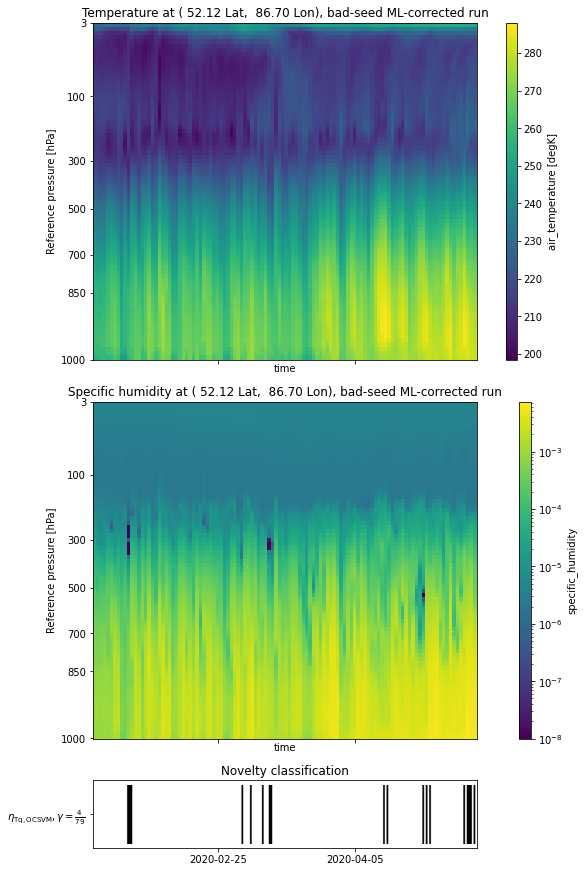

In [45]:
for _ in range(1):
    rand_tile = np.random.randint(0, 6, 1)[0]
    rand_x = np.random.randint(0, 48, 1)[0]
    rand_y = np.random.randint(0, 48, 1)[0]
    plots_temp_hum_novelty(rand_x, rand_y, rand_tile, is_barcode=True, is_reference=False)
    # plots_temp_hum_novelty(rand_x, rand_y, rand_tile, is_barcode=True, is_reference=True)

In [61]:
def find_coords_by_lat_lon(lat, lon):
    dist = 4 * (crashed_states.latitude.isel(time=0) - lat * math.pi / 180)**2 + (crashed_states.longitude.isel(time=0) - lon * math.pi / 180)**2
    # print(dist.min().values)
    # fig, subplots, _, _, _  = fv3viz.plot_cube(
    #     dist.to_dataset(name="ds").merge(grid),
    #     "ds",
    # )
    min_coords = np.where(dist == dist.min())
    tile = min_coords[0][0]
    x = min_coords[2][0]
    y = min_coords[1][0]
    lat_close = crashed_states.latitude.isel(x=x, y=y, tile=tile, time=0).values * 180 / math.pi
    lon_close = crashed_states.longitude.isel(x=x, y=y, tile=tile, time=0).values * 180 / math.pi
    print(f"Closest cell to ({lat}, {lon}): ({lat_close}, {lon_close})")
    return tile, x, y

Closest cell to (23.13, 113.26): (23.281307362632155, 112.49023415215534)


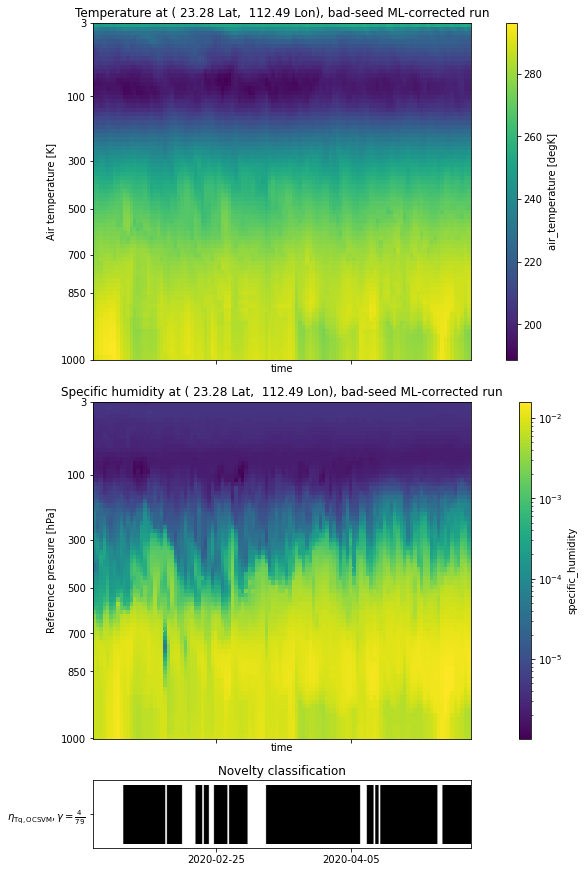

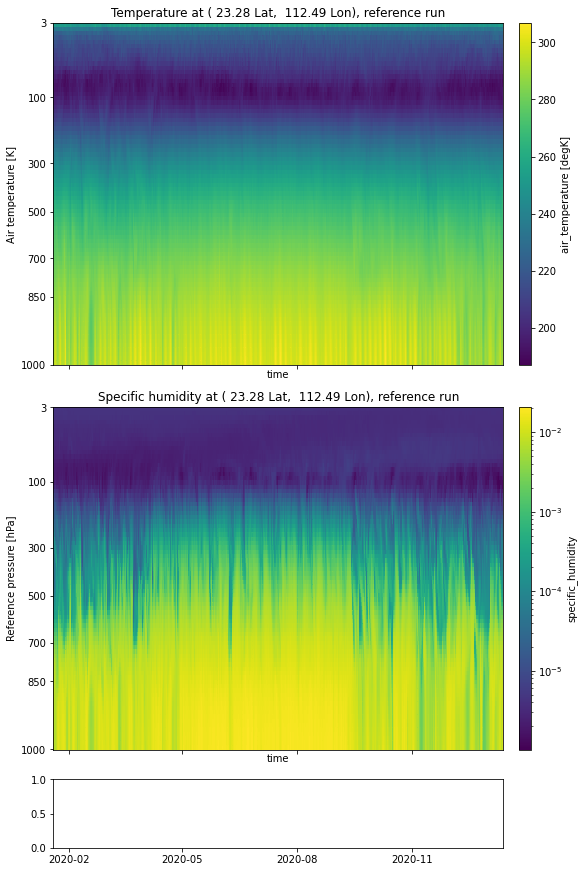

In [62]:
# search over Guangzhou
tile, x, y = find_coords_by_lat_lon(23.13, 113.26)
plots_temp_hum_novelty(x, y, tile, is_barcode=True, is_reference=False)
plots_temp_hum_novelty(x, y, tile, is_barcode=False, is_reference=True)

Closest cell to (0, 75): (-1.0345094272141695, 74.81300278287763)


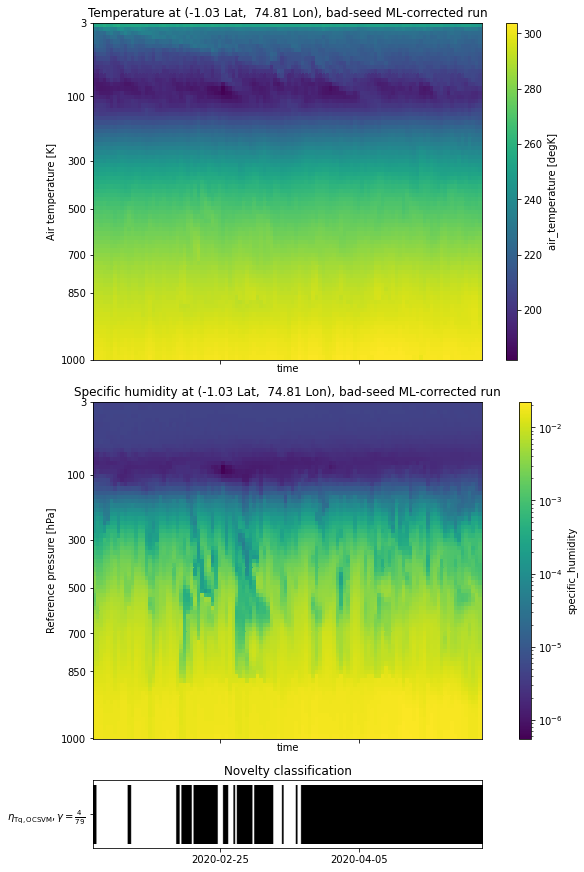

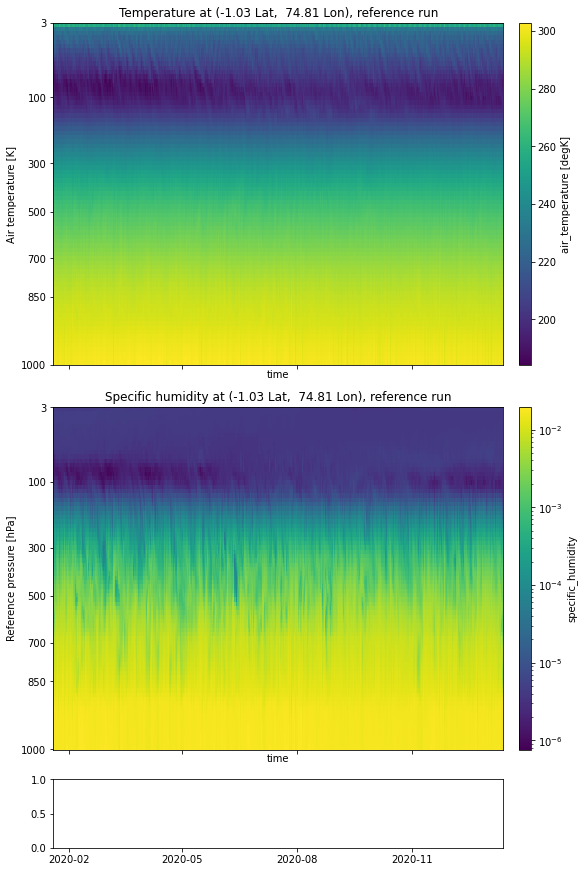

In [63]:
# Indian Ocean
tile, x, y = find_coords_by_lat_lon(0, 75)
plots_temp_hum_novelty(x, y, tile, is_barcode=True, is_reference=False)
plots_temp_hum_novelty(x, y, tile, is_barcode=False, is_reference=True)

Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-07-13/oos-test/novelty/diags_novelty_offline_truncated/bc5987e3620f62a375588ce8261e81fb.
(7323.125, 7361.625, 0.775, 0.975)
Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-07-20/tq-combined-nd-trial-2/trained_models/minmax/diags_novelty_offline_truncated/bc5987e3620f62a375588ce8261e81fb.
(7323.125, 7361.625, 0.525, 0.725)
Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-07-18/ocsvm-gamma-trial-1/trained_models/ocsvm-large/diags_novelty_offline_truncated/bc5987e3620f62a375588ce8261e81fb.
(7323.125, 7361.625, 0.275, 0.475)
Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-08-09/tq-combined-nd-trial-1/trained_models/ocsvm-larger-gamma/diags_novelty_offline_truncated/bc5987e3620f62a375588ce8261e81fb.
(7323.125, 7361.625, 0.025, 0.225)


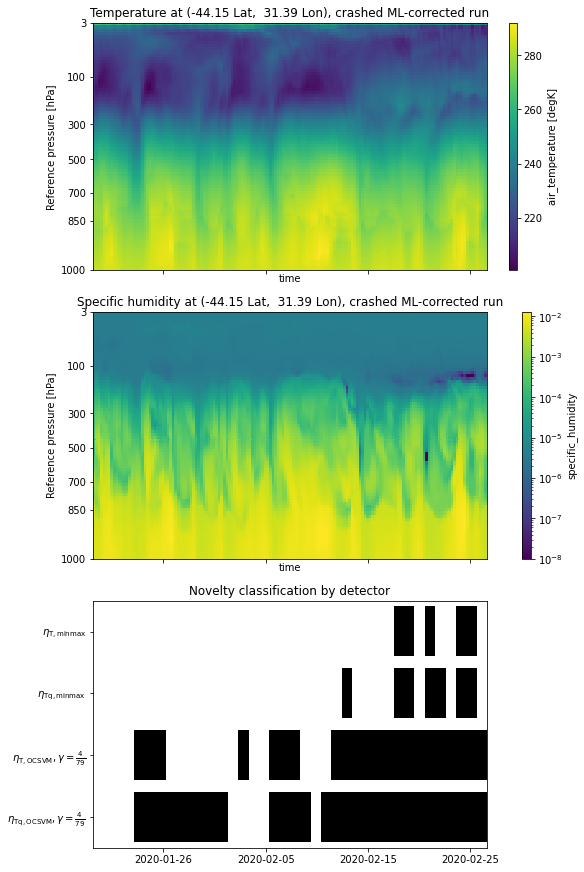

Computing offline novelty data from states from reference.
Saved online novelty data to gs://vcm-ml-experiments/claytons/2022-07-13/oos-test/novelty/diags_novelty_offline_truncated/b8af13ea9c8fe890c9979a1fa8dbde22.
(7323.1875, 7361.5625, 0.775, 0.975)
Computing offline novelty data from states from reference.
Saved online novelty data to gs://vcm-ml-experiments/claytons/2022-07-20/tq-combined-nd-trial-2/trained_models/minmax/diags_novelty_offline_truncated/b8af13ea9c8fe890c9979a1fa8dbde22.
(7323.1875, 7361.5625, 0.525, 0.725)
Computing offline novelty data from states from reference.
1
2
2.5
3
4
5
6
7
Saved online novelty data to gs://vcm-ml-experiments/claytons/2022-07-18/ocsvm-gamma-trial-1/trained_models/ocsvm-large/diags_novelty_offline_truncated/b8af13ea9c8fe890c9979a1fa8dbde22.
(7323.1875, 7361.5625, 0.275, 0.475)
Computing offline novelty data from states from reference.
1
2
2.5
3
4
5
6
7
Saved online novelty data to gs://vcm-ml-experiments/claytons/2022-08-09/tq-combined-nd-tri

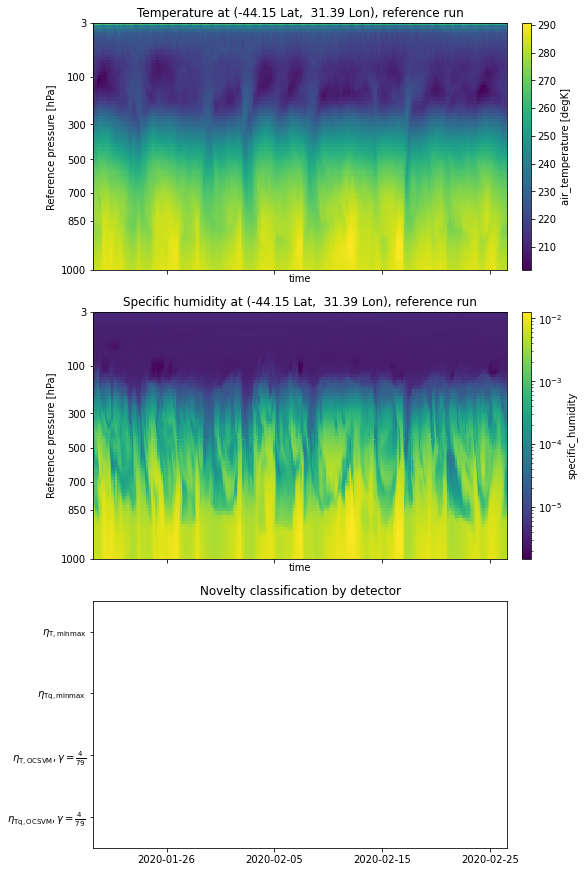

In [62]:
tile, x, y = find_coords_by_lat_lon(-44.15, 38.61)
plots_temp_hum_novelty(x, y, tile, is_barcode=True, is_reference=False)
plots_temp_hum_novelty(x, y, tile, is_barcode=True, is_reference=True)

Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-07-13/oos-test/novelty/diags_novelty_offline_truncated/bc5987e3620f62a375588ce8261e81fb.
(7323.125, 7361.625, 0.775, 0.975)
Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-07-20/tq-combined-nd-trial-2/trained_models/minmax/diags_novelty_offline_truncated/bc5987e3620f62a375588ce8261e81fb.
(7323.125, 7361.625, 0.525, 0.725)
Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-07-18/ocsvm-gamma-trial-1/trained_models/ocsvm-large/diags_novelty_offline_truncated/bc5987e3620f62a375588ce8261e81fb.
(7323.125, 7361.625, 0.275, 0.475)
Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-08-09/tq-combined-nd-trial-1/trained_models/ocsvm-larger-gamma/diags_novelty_offline_truncated/bc5987e3620f62a375588ce8261e81fb.
(7323.125, 7361.625, 0.025, 0.225)


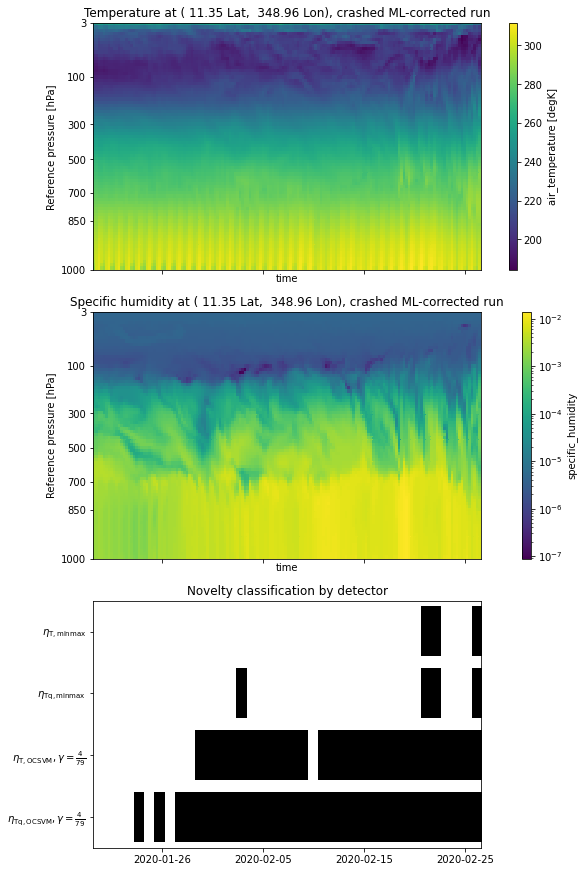

Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-07-13/oos-test/novelty/diags_novelty_offline_truncated/b8af13ea9c8fe890c9979a1fa8dbde22.
(7323.1875, 7361.5625, 0.775, 0.975)
Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-07-20/tq-combined-nd-trial-2/trained_models/minmax/diags_novelty_offline_truncated/b8af13ea9c8fe890c9979a1fa8dbde22.
(7323.1875, 7361.5625, 0.525, 0.725)
Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-07-18/ocsvm-gamma-trial-1/trained_models/ocsvm-large/diags_novelty_offline_truncated/b8af13ea9c8fe890c9979a1fa8dbde22.
(7323.1875, 7361.5625, 0.275, 0.475)
Reading offline novelty data from previous computation, at gs://vcm-ml-experiments/claytons/2022-08-09/tq-combined-nd-trial-1/trained_models/ocsvm-larger-gamma/diags_novelty_offline_truncated/b8af13ea9c8fe890c9979a1fa8dbde22.
(7323.1875, 7361.5625, 0.025, 0.225)


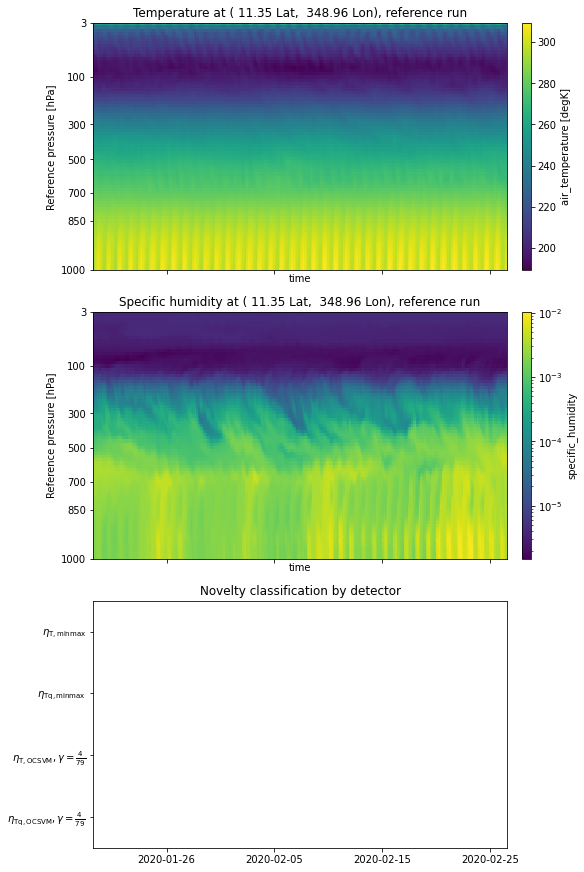

In [63]:
tile, x, y = find_coords_by_lat_lon(0, -62)
plots_temp_hum_novelty(x, y, tile, is_barcode=True, is_reference=False)
plots_temp_hum_novelty(x, y, tile, is_barcode=True, is_reference=True)

In [123]:
crashed_states.pressure_thickness_of_atmospheric_layer.isel(z=0).max().values

array(346.7159424)

In [124]:
crashed_states.pressure_thickness_of_atmospheric_layer.isel(z=0).min().values

array(346.71594236)

In [135]:
crashed_states

<xarray.Dataset>
Dimensions:                                                 (time: 154, tile: 6, z: 79, y: 48, x: 48, z_soil: 4)
Coordinates:
  * time                                                    (time) object 202...
Dimensions without coordinates: tile, z, y, x, z_soil
Data variables: (12/36)
    air_temperature                                         (time, tile, z, y, x) float64 dask.array<chunksize=(10, 6, 79, 48, 48), meta=np.ndarray>
    clear_sky_downward_longwave_flux_at_surface             (time, tile, y, x) float64 dask.array<chunksize=(10, 6, 48, 48), meta=np.ndarray>
    clear_sky_downward_shortwave_flux_at_surface            (time, tile, y, x) float64 dask.array<chunksize=(10, 6, 48, 48), meta=np.ndarray>
    clear_sky_upward_longwave_flux_at_surface               (time, tile, y, x) float64 dask.array<chunksize=(10, 6, 48, 48), meta=np.ndarray>
    clear_sky_upward_longwave_flux_at_top_of_atmosphere     (time, tile, y, x) float64 dask.array<chunksize=(10, 6, 48, 48), meta=np.ndarray>
    clear_sky_upward_shortwave_flux_at_surface              (time, tile, y, x) float64 dask.array<chunksize=(10, 6, 48, 48), meta=np.ndarray>
    ...                                                      ...
    total_sky_upward_longwave_flux_at_top_of_atmosphere     (time, tile, y, x) float64 dask.array<chunksize=(10, 6, 48, 48), meta=np.ndarray>
    total_sky_upward_shortwave_flux_at_surface              (time, tile, y, x) float64 dask.array<chunksize=(10, 6, 48, 48), meta=np.ndarray>
    total_sky_upward_shortwave_flux_at_top_of_atmosphere    (time, tile, y, x) float64 dask.array<chunksize=(10, 6, 48, 48), meta=np.ndarray>
    total_soil_moisture                                     (time, tile, z_soil, y, x) float64 dask.array<chunksize=(10, 6, 4, 48, 48), meta=np.ndarray>
    vertical_thickness_of_atmospheric_layer                 (time, tile, z, y, x) float64 dask.array<chunksize=(10, 6, 79, 48, 48), meta=np.ndarray>
    vertical_wind                                           (time, tile, z, y, x) float64 dask.array<chunksize=(10, 6, 79, 48, 48), meta=np.ndarray>

## Longitude surface precip

In [ ]:
from fv3net.diagnostics.prognostic_run.computed_diagnostics import ComputedDiagnosticsList
import matplotlib.pyplot as plt
import xarray as xr
plt.rcParams['figure.dpi'] = 150


In [ ]:
URLS = [
    diagnostics_path(BASELINE_ALG),
    diagnostics_path(ML_ONLY_ALG),
    diagnostics_path(OCSVM_DEFAULT)
]
NAMES = [r"Baseline", r"ML-corrected $g_{\mathrm{Tq}}$", r"ND ML $g_{Tquv}, \eta_{\mathrm{Tq, OCSVM}}$"]


In [ ]:
computed_diags = ComputedDiagnosticsList.from_urls(URLS)


In [ ]:
metadata, diags = computed_diags.load_diagnostics()


/home/claytons/fv3net/workflows/diagnostics/fv3net/diagnostics/prognostic_run/computed_diagnostics.py:404: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'julian', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  return ds.assign_coords({dim: ds.indexes[dim].to_datetimeindex()})
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/home/claytons/fv3net/external/vcm/vcm/calc/calc.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(array * weights, axis=axis) / np.nansum(weights, axis=axis)
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/home/claytons/fv3net/external/vcm/vcm/calc/calc.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(array * w

In [ ]:
def merge_with_verif(diags, varname):
    merged = []
    for i, run in enumerate(NAMES):
        da = diags.get_variable(str(i), varname).assign_coords(run=run)
        merged.append(da)
    merged = xr.concat(merged, dim='run')
    verif = diags.get_variable('0', varname) - diags.get_variable('0', varname.replace('value', 'bias'))
    return xr.concat([merged, verif.assign_coords(run='Verification')], 'run')


Text(0.5, 1.0, 'Verification')

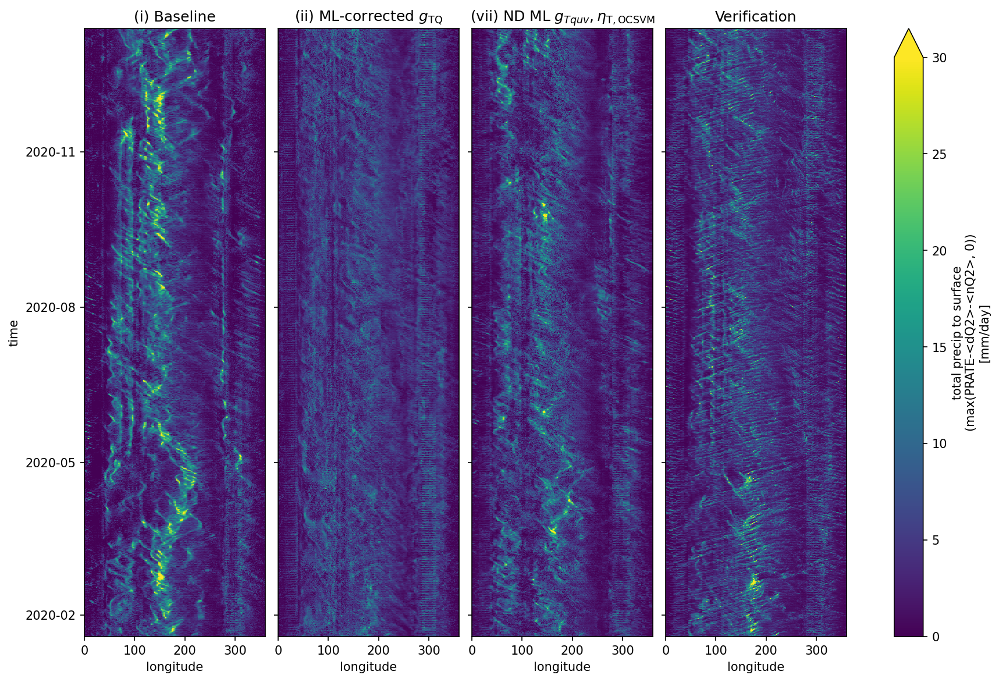

In [ ]:
hovmoller = merge_with_verif(diags, 'total_precip_to_surface_deep_tropical_meridional_mean_value')
fg = hovmoller.plot(x='longitude', col='run', vmin=0, vmax=30)
fg.fig.set_size_inches((12, 10))
fg.axes[0][0].set_ylabel("time")
for i in range(3):
    fg.axes[0][i].set_title(NAMES[i])
fg.axes[0][3].set_title("Verification")
